# Importing Necessary Libraries

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
aimport pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import math
import os
import random
import warnings
warnings.filterwarnings('ignore')

from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
from PIL import Image

import keras
from tensorflow import keras
from keras import Sequential
from keras import layers
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Dense, Dropout, Activation, BatchNormalization, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

In [ ]:
try:
    if tf.test.gpu_device_name():
        physical_devices = tf.config.experimental.list_physical_devices('GPU')
        print('GPU active! -', physical_devices)
    else:
        print('GPU not active!')
except Exception as e:
    print('An error occurred while checking the GPU:', e)

GPU active! - [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# Importing Dataset


* CN (Cognitively Normal): Individuals without cognitive impairment.
* MCI (Mild Cognitive Impairment): Individuals with a subtle decline in cognitive abilities that may or may not progress to more severe conditions.
* LMCI (Late Mild Cognitive Impairment): A stage within the MCI category, typically representing a later or more advanced phase of mild cognitive impairment.
* EMCI (Early Mild Cognitive Impairment): Another stage within the MCI category, indicating an earlier or less advanced phase of mild cognitive impairment.


There are 1912 images in the CN folder.
There are 860 images in the EMCI folder.
There are 1782 images in the MCI folder.
There are 2352 images in the LMCI folder.
The search has been completed.


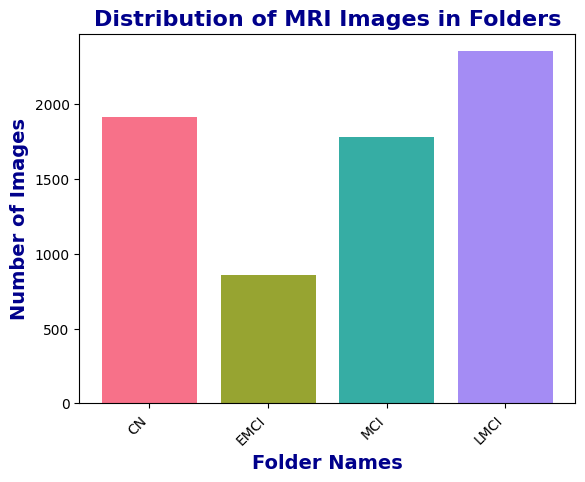

In [ ]:
import os
import matplotlib.pyplot as plt
import seaborn as sns

folder_path = '/content/drive/MyDrive/Capstone/MRI_Segmented_Augmented'
class_dist = {}
image_extensions = ['.jpg', '.jpeg', '.png']

def count_images_in_folder(dir_path):
    count = 0
    for filename in os.listdir(dir_path):
        file_ext = os.path.splitext(filename)[1].lower()

        if file_ext in image_extensions:
            count += 1
    return count

def analyze_folder_structure():
    for root, dirs, _ in os.walk(folder_path):
        for dir_name in dirs:
            dir_path = os.path.join(root, dir_name)
            count = count_images_in_folder(dir_path)
            class_dist[dir_name] = count
            print(f"There are \033[35m{count}\033[0m images in the {dir_name} folder.")
    print('\033[92m' + "The search has been completed." + '\033[0m')

def plot_distribution_bar_chart():
    keys = list(class_dist.keys())
    values = list(class_dist.values())

    colors = sns.color_palette("husl", len(keys))

    plt.bar(keys, values, color=colors)
    plt.xlabel('Folder Names', fontsize=14, fontweight="bold", color="darkblue")
    plt.ylabel('Number of Images', fontsize=14, fontweight="bold", color="darkblue")
    plt.title('Distribution of MRI Images in Folders', fontsize=16, fontweight="bold", color="darkblue")
    plt.xticks(rotation=45, ha='right')
    plt.show()

analyze_folder_structure()
plot_distribution_bar_chart()

<p style="color: black; background-color: lightsteelblue; border:2px solid black;">Let's see some samples for each class!</p>

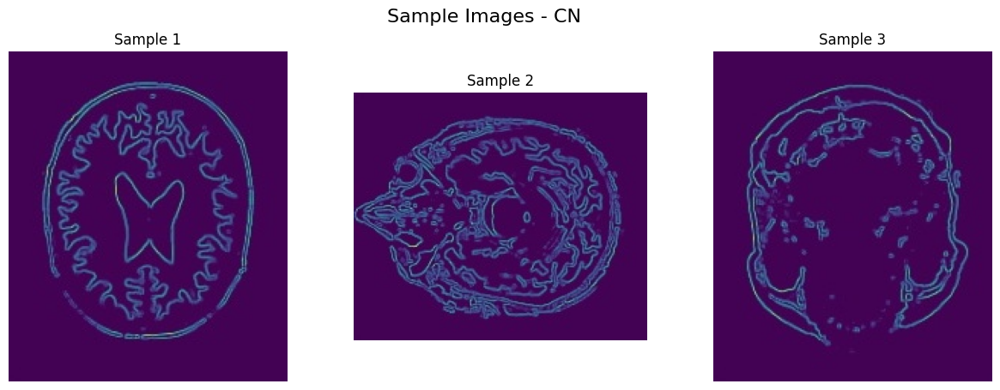

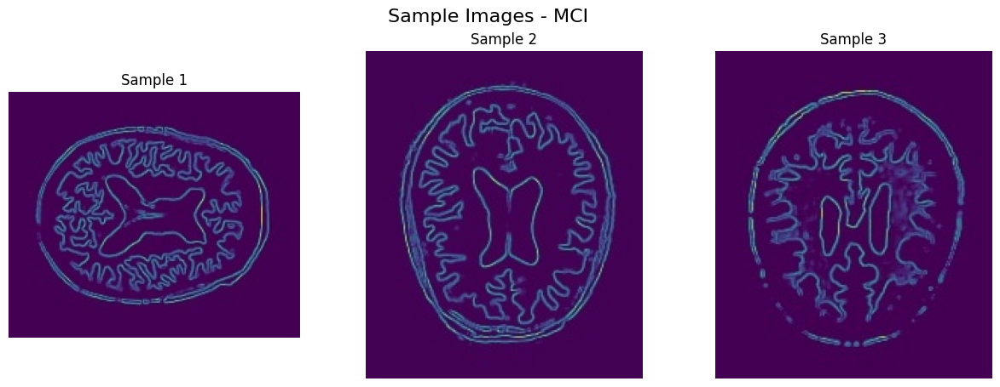

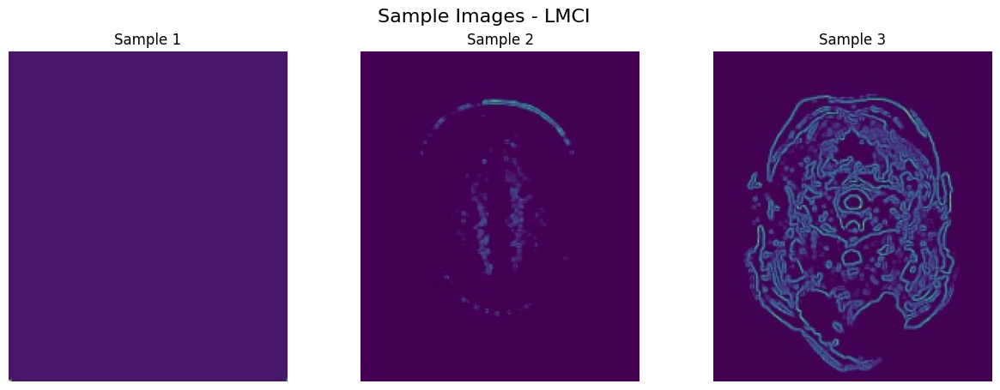

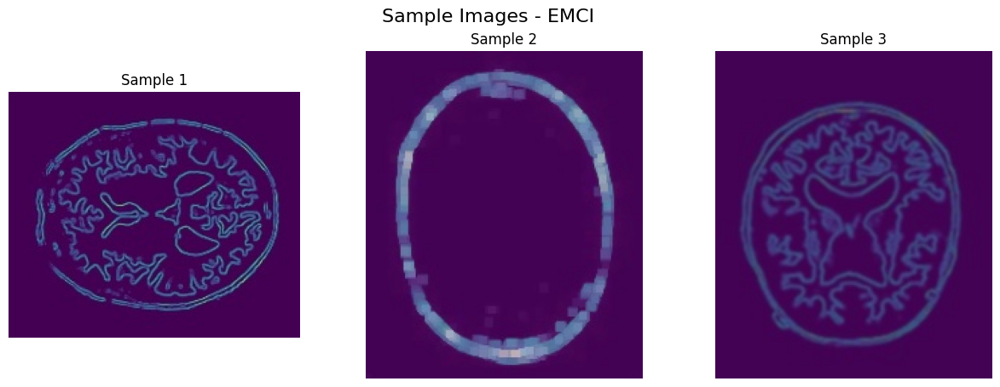

In [ ]:
base_path = '/content/drive/MyDrive/Capstone/MRI_Segmented_Augmented'
categories = ['CN', 'MCI', 'LMCI', 'EMCI']
def display_sample_images(category, num_images=3):
    category_path = os.path.join(base_path, category)
    image_files = [f for f in os.listdir(category_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
    selected_images = random.sample(image_files, num_images)
    plt.figure(figsize=(15, 5))
    for i, image_name in enumerate(selected_images):
        image_path = os.path.join(category_path, image_name)
        image = Image.open(image_path)

        plt.subplot(1, num_images, i+1)
        plt.imshow(image, cmap='gray', vmin=0, vmax=255)
        plt.title(f'Sample {i+1}')
        plt.axis('off')

    plt.suptitle(f'Sample Images - {category}', fontsize=16)
    plt.show()
for category in categories:
    display_sample_images(category)


# Data Preprocessing

* It sets the batch size for the dataset to 32.
* Images are resized to a square shape of 128x128 pixels using the image_size parameter.
* The dataset is shuffled with shuffle=True, ensuring randomness in the order of samples.
* The seed parameter ensures reproducibility by fixing the random seed to 42.


In [ ]:
dataset = tf.keras.utils.image_dataset_from_directory(base_path,
                                                batch_size = 32,
                                                image_size=(128, 128),
                                                shuffle=True,
                                                seed=42,)

class_names = dataset.class_names

Found 6906 files belonging to 4 classes.


<p style="color: black; background-color: lightsteelblue; border:2px solid black;">Pixel normalization improves the performance of a neural network. Therefore, we will go with pixel values from 0 to 1, rather than values in the range 0 to 255.</p>

In [ ]:
MRI = {index: img for index, img in enumerate(dataset.class_names)}

class Process:
    def __init__(self, data):
        self.data = data.map(lambda x, y: (x/255, y))

    def create_new_batch(self):
        self.batch = self.data.as_numpy_iterator().next()
        text = "Min and max pixel values in the batch ->"
        print(text, self.batch[0].min(), "&", self.batch[0].max())

    def show_batch_images(self, number_of_images=5):
        fig, ax = plt.subplots(ncols=number_of_images, figsize=(20,20), facecolor="gray")
        fig.suptitle("Brain MRI Samples in the Batch", color="blue",fontsize=18, fontweight='bold', y=0.6)
        for idx, img in enumerate(self.batch[0][:number_of_images]):
            ax[idx].imshow(img)
            class_no = self.batch[1][idx]
            ax[idx].set_title(MRI[class_no], color="aqua")
            ax[idx].set_xticklabels([])
            ax[idx].set_yticklabels([])

    def train_test_val_split(self, train_size, val_size, test_size):

        train = int(len(self.data)*train_size)
        test = int(len(self.data)*test_size)
        val = int(len(self.data)*val_size)

        train_data = self.data.take(train)
        val_data = self.data.skip(train).take(val)
        test_data = self.data.skip(train+val).take(test)

        return train_data, val_data, test_data

Min and max pixel values in the batch -> 0.0 & 0.9775361


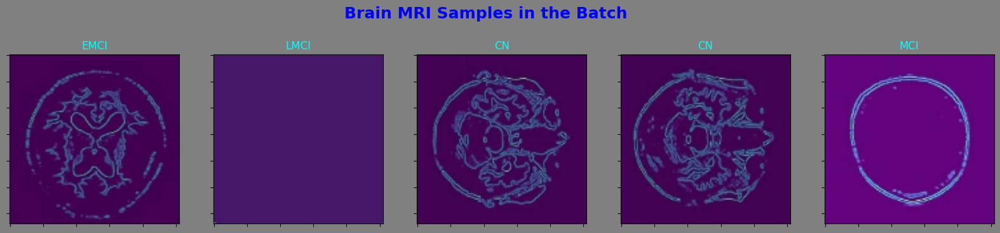

In [ ]:
df = Process(dataset)
df.create_new_batch()
df.show_batch_images(number_of_images=5)

### Splitting the Data

In [ ]:
train_data, val_data, test_data= df.train_test_val_split(train_size=0.8, val_size=0.1, test_size=0.1)

#### Preprocessing the Training set

To address the imbalanced distribution of target classes in our training data, we calculate class weights, which help the model better recognize minority classes, and then use these weights during model training for improved performance.

compute_class_weight function from scikit-learn is used to calculate class weights for the dataset, with the parameter 'balanced' indicating that class weights should be inversely proportional to class frequencies in the input data.

In [ ]:
y_train = tf.concat(list(map(lambda x: x[1], train_data)), axis=0)
class_weight = compute_class_weight('balanced',classes=np.unique(y_train), y=y_train.numpy())
class_weights = dict(zip(np.unique(y_train), class_weight))

# Model Building

* Input Layer:
  Shape: (128, 128, 3), Represents the input image with 128x128 pixel resolution and 3 channels (RGB).
  
* Convolutional Layers:

  Conv2D (filters=16, kernel_size=(3, 3), strides=(1, 1), activation="relu"): Extracts 16 features using a 3x3 filter kernel, applies ReLU activation for non-linearity.
  MaxPooling2D (pool_size=(2, 2)): Reduces spatial dimensions by 2 in each direction using max pooling.
  
  Conv2D (filters=32, kernel_size=(3, 3), strides=(1, 1), activation="relu"): Similar to the first Conv2D but extracts 32 features.
  MaxPooling2D (pool_size=(2, 2)): Similar to the first MaxPooling2D.
  Conv2D (filters=128, kernel_size=(3, 3), strides=(1, 1), activation="relu"): Similar to the second Conv2D but extracts 128 features.
  
  MaxPooling2D (pool_size=(2, 2)): Similar to the previous MaxPooling2D.

* Fully-Connected Layers:

  Flatten(): Converts the 3D output of the last convolutional layer into a 1D vector.
  Dense (units=128, activation="relu"): Densely connected layer with 128 neurons and ReLU activation.
  Dense (units=64, activation="relu"): Similar to the previous Dense layer with 64 neurons.
  Dense (units=4, activation="softmax"): Final output layer with 4 neurons and softmax activation for 4-class classification.

* Output Layer: Probabilities for each of the 4 classes.

In [ ]:
def build_model():
    model = Sequential()

    model.add(Conv2D(filters=16, kernel_size=(3, 3), strides=(1, 1), activation="relu", kernel_initializer='he_normal',
                     input_shape=(128, 128, 3)))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(filters=32, kernel_size=(3, 3), strides=(1, 1), activation="relu", kernel_initializer='he_normal'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation="relu", kernel_initializer='he_normal'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Flatten())
    model.add(Dense(128, activation="relu", kernel_initializer='he_normal'))
    model.add(Dense(64, activation="relu"))
    model.add(Dense(4, activation="softmax"))

    model.compile(optimizer='adam', loss="sparse_categorical_crossentropy", metrics=['accuracy'])

    model.summary()

    return model

model = build_model()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 63, 63, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 30, 30, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 28, 28, 128)       36992     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 14, 14, 128)      

<h2 style="color: white; background-color: dodgerblue; font-weight: bold; text-align: center; border:3px solid black;">Callbacks</h2>

In [ ]:
def checkpoint_callback():

    checkpoint_filepath = '/tmp/checkpoint'

    model_checkpoint_callback= ModelCheckpoint(filepath=checkpoint_filepath,
                           save_weights_only=False,
                           frequency='epoch',
                           monitor='val_accuracy',
                           save_best_only=True,
                           verbose=1)

    return model_checkpoint_callback

def early_stopping(patience):
    es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=patience, verbose=1)
    return es_callback


EPOCHS = 20
checkpoint_callback = checkpoint_callback()
early_stopping = early_stopping(patience=5)
callbacks = [checkpoint_callback, early_stopping]

In [ ]:
history = model.fit(train_data, epochs = EPOCHS, validation_data = val_data, class_weight = class_weights, callbacks = callbacks)

Epoch 1/20
172/172 [==============================] - ETA: 0s - loss: 1.0521 - accuracy: 0.5819
Epoch 1: val_accuracy improved from -inf to 0.79018, saving model to /tmp/checkpoint
172/172 [==============================] - 36s 197ms/step - loss: 1.0521 - accuracy: 0.5819 - val_loss: 0.5881 - val_accuracy: 0.7902
Epoch 2/20
172/172 [==============================] - ETA: 0s - loss: 0.5106 - accuracy: 0.8203
Epoch 2: val_accuracy improved from 0.79018 to 0.86161, saving model to /tmp/checkpoint
172/172 [==============================] - 34s 194ms/step - loss: 0.5106 - accuracy: 0.8203 - val_loss: 0.3775 - val_accuracy: 0.8616
Epoch 3/20
172/172 [==============================] - ETA: 0s - loss: 0.3125 - accuracy: 0.8912
Epoch 3: val_accuracy improved from 0.86161 to 0.89137, saving model to /tmp/checkpoint
172/172 [==============================] - 39s 226ms/step - loss: 0.3125 - accuracy: 0.8912 - val_loss: 0.3289 - val_accuracy: 0.8914
Epoch 4/20
172/172 [=============================

<h2 style="color: white; background-color: dodgerblue; font-weight: bold; text-align: center; border:3px solid black;">Loss and Accuracy</h2>

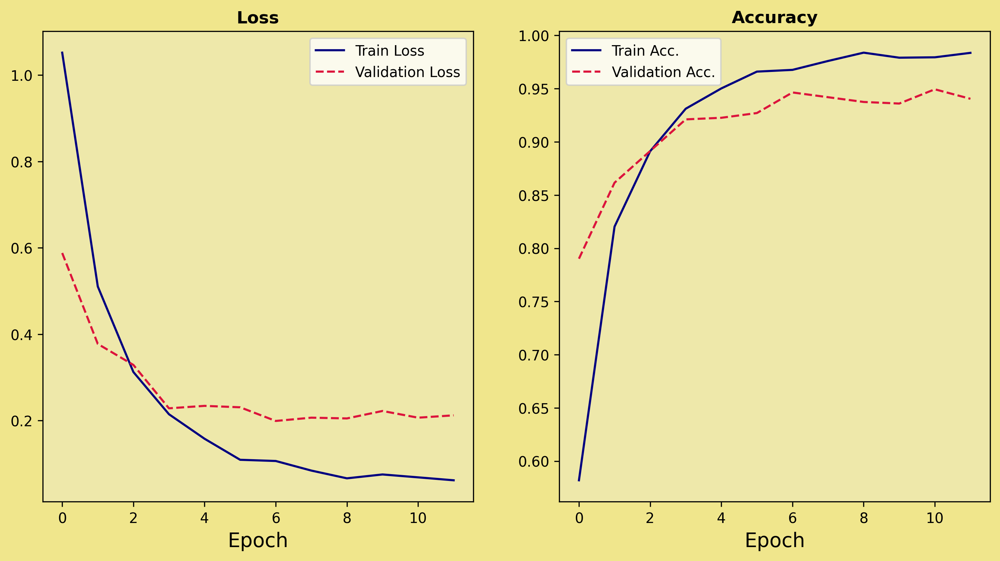

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(12,6), facecolor="khaki")
ax[0].set_facecolor('palegoldenrod')
ax[0].set_title('Loss', fontweight="bold")
ax[0].set_xlabel("Epoch", size=14)
ax[0].plot(history.epoch, history.history["loss"], label="Train Loss", color="navy")
ax[0].plot(history.epoch, history.history["val_loss"], label="Validation Loss", color="crimson", linestyle="dashed")
ax[0].legend()
ax[1].set_facecolor('palegoldenrod')
ax[1].set_title('Accuracy', fontweight="bold")
ax[1].set_xlabel("Epoch", size=14)
ax[1].plot(history.epoch, history.history["accuracy"], label="Train Acc.", color="navy")
ax[1].plot(history.epoch, history.history["val_accuracy"], label="Validation Acc.", color="crimson", linestyle="dashed")
ax[1].legend()

In [ ]:
model.save(os.path.join('/content/drive/MyDrive/Capstone/Models/', 'cnn_seg_aug_model.h5'))
print("Model saved successfully after training!")

Model saved successfully after training!


# CNN Segmented Model Prediction

In [ ]:
from tensorflow.keras.models import load_model
saved_model_path = '/content/drive/MyDrive/Capstone/Models/cnn_seg_aug_model.h5'
cnn_model = load_model(saved_model_path)

<h2 style="color: white; background-color: dodgerblue; font-weight: bold; text-align: center; border:3px solid black;">Classification Report</h2>

In [ ]:
predictions = []
labels = []

for X, y in test_data.as_numpy_iterator():
    y_pred = cnn_model.predict(X, verbose=0)
    y_prediction = np.argmax(y_pred, axis=1)
    predictions.extend(y_prediction)
    labels.extend(y)

predictions = np.array(predictions)
labels = np.array(labels)

print(classification_report(labels, predictions, target_names=class_names))

              precision    recall  f1-score   support

          CN       0.90      0.90      0.90       175
        EMCI       0.94      0.82      0.88        77
        LMCI       0.99      1.00      0.99       235
         MCI       0.90      0.94      0.92       185

    accuracy                           0.93       672
   macro avg       0.93      0.91      0.92       672
weighted avg       0.93      0.93      0.93       672



<h2 style="color: white; background-color: dodgerblue; font-weight: bold; text-align: center; border:3px solid black;">Confusion Matrix</h2>

Text(287.16666666666663, 0.5, 'True')

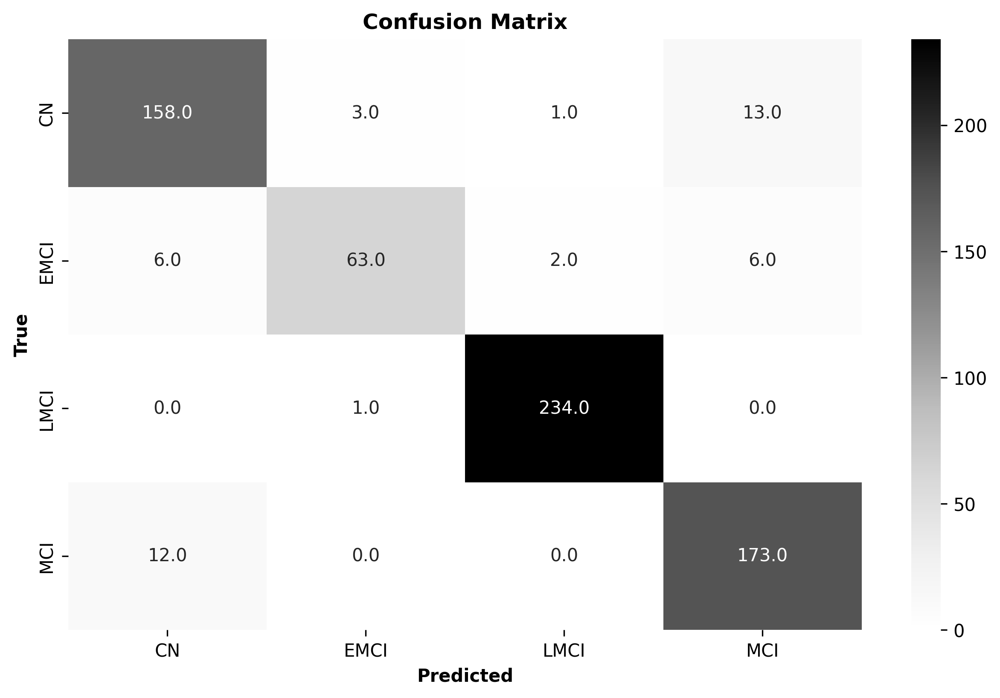

In [ ]:
cm = confusion_matrix(labels, predictions)
cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)
cm_df
plt.figure(figsize=(10,6), dpi=300)
sns.heatmap(cm_df, annot=True, cmap="Greys", fmt=".1f")
plt.title("Confusion Matrix", fontweight="bold")
plt.xlabel("Predicted", fontweight="bold")
plt.ylabel("True", fontweight="bold")

<p style="color: black; background-color: lightsteelblue; border:2px solid black;">
Let's create a function that fetches a random image and displays a pie chart showing the probability distribution of which target value the image belongs to, represented as percentages. In this way, it will be seen which class the model gives the highest probability to.</p>

<h2 style="color: white; background-color: dodgerblue; font-weight: bold; text-align: center; border:3px solid black;">Cognitive Probability of a Random MRI from Test Data</h2>

1/1 [==============================] - 0s 406ms/step


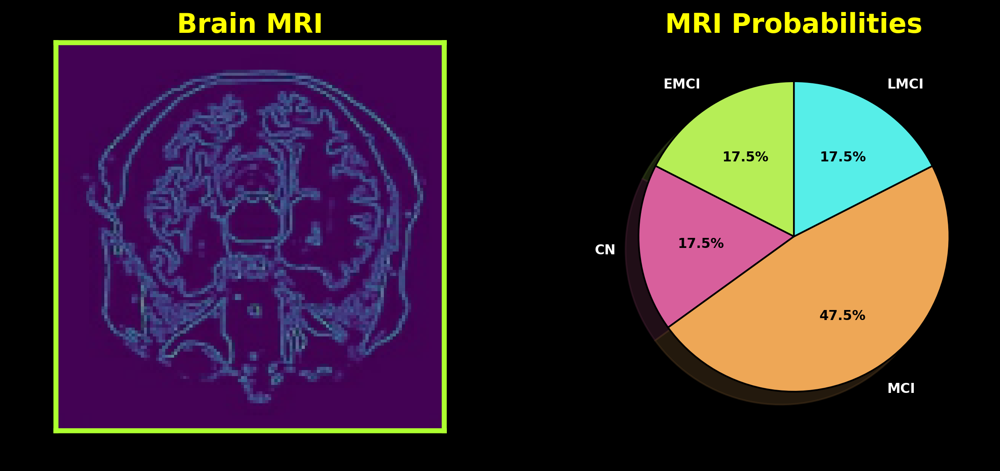

In [ ]:
plt.rcParams["figure.figsize"] = (10,6)
plt.rcParams['figure.dpi'] = 300
colors = ["#B6EE56", "#D85F9C", "#EEA756", "#56EEE8"]
def random_mri_prob_bringer(image_number=0):

    for images, _ in test_data.skip(5).take(1):
        image = images[image_number]
        pred = cnn_model.predict(tf.expand_dims(image, 0))[0]

    probs = list(tf.nn.softmax(pred).numpy())
    probs_dict = dict(zip(class_dist.keys(), probs))

    keys = list(probs_dict.keys())
    values = list(probs_dict.values())

    fig, (ax1, ax2) = plt.subplots(1, 2, facecolor='black')
    plt.subplots_adjust(wspace=0.4)
    ax1.imshow(image)
    ax1.set_title('Brain MRI', color="yellow", fontweight="bold", fontsize=16)

    edges = ['left', 'bottom', 'right', 'top']
    edge_color = "greenyellow"
    edge_width = 3
    for edge in edges:
        ax1.spines[edge].set_linewidth(edge_width)
        ax1.spines[edge].set_edgecolor(edge_color)

    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])

    wedges, labels, autopct = ax2.pie(values, labels=keys,  autopct='%1.1f%%',
        shadow=True, startangle=90, colors=colors, textprops={'fontsize': 8, "fontweight":"bold", "color":"white"},  wedgeprops=
       {'edgecolor':'black'} , labeldistance=1.15)

    for autotext in autopct:
        autotext.set_color('black')

    ax2.set_title('MRI Probabilities', color="yellow", fontweight="bold", fontsize=16)

rand_img_no = np.random.randint(1, 32)
random_mri_prob_bringer(image_number=rand_img_no)

<p style="color: black; background-color: lightsteelblue; border:2px solid black;">
Now, let's see the actual classes and predicted classes of these samples by bringing samples from our test data.</p>

<h2 style="color: white; background-color: dodgerblue; font-weight: bold; text-align: center; border:3px solid black;">Comparing Predicted Classes with the Actual Classes from the Test Data</h2>

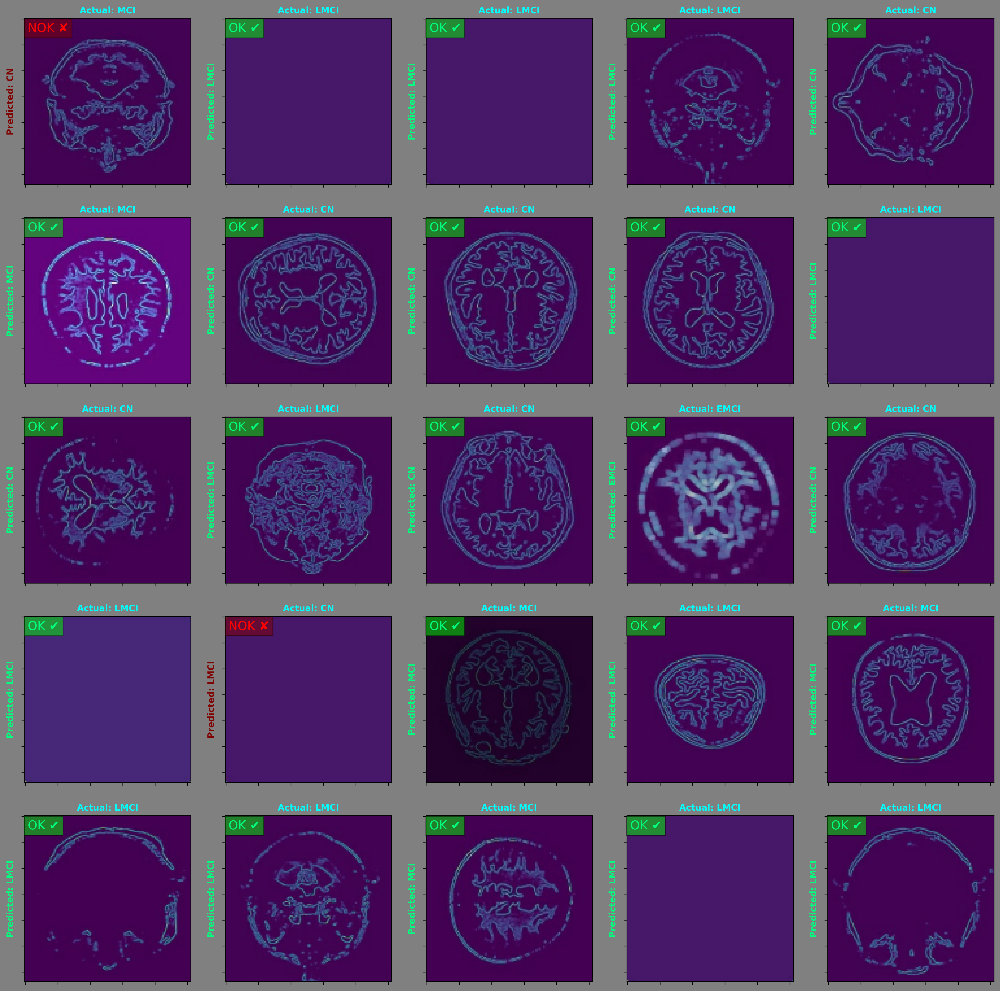

In [ ]:
plt.figure(figsize=(20, 20), facecolor="gray")
for images, labels in test_data.take(1):
    for i in range(25):
        ax = plt.subplot(5, 5, i + 1)
        plt.imshow(images[i])
        predictions = cnn_model.predict(tf.expand_dims(images[i], 0), verbose=0)
        score = tf.nn.softmax(predictions[0])
        if(class_names[labels[i]]==class_names[np.argmax(score)]):
            plt.title("Actual: "+class_names[labels[i]], color="aqua", fontweight="bold", fontsize=10)
            plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="springgreen", fontweight="bold", fontsize=10)
            ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
            ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

        else:
            plt.title("Actual: "+class_names[labels[i]], color="aqua", fontweight="bold", fontsize=10)
            plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
            nok_text = plt.text(2, 10, "NOK \u2718", color="red", fontsize=14)
            nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
        plt.gca().axes.yaxis.set_ticklabels([])
        plt.gca().axes.xaxis.set_ticklabels([])

# Feature Extraction

In [ ]:
import os
import numpy as np
import tensorflow as tf
from keras.models import load_model

model = load_model('/content/drive/MyDrive/Capstone/Models/inception_seg_aug_model.h5')

base_path = "/content/drive/MyDrive/Capstone/MRI_Segmented_Augmented"

dataset = tf.keras.utils.image_dataset_from_directory(
    base_path,
    batch_size=32,
    image_size=(128, 128),
    shuffle=True,
    seed=42
)

features_list = []
labels_list = []

for images, labels in dataset:

    features = model.predict(images)

    features_list.append(features)
    labels_list.append(labels)

features_array = np.concatenate(features_list, axis=0)
labels_array = np.concatenate(labels_list, axis=0)

In [ ]:
label_categories = ['CN', 'MCI', 'LMCI', 'EMCI']

mapped_labels = [label_categories[label] for label in labels_array]

sample_size = 5
print("Sample labels:")
for i in range(sample_size):
    print(f"Sample {i+1} - Label: {mapped_labels[i]}, Features: {features_array[i]}")

In [ ]:
label_categories = ['CN', 'MCI', 'LMCI', 'EMCI']

mapped_labels = [label_categories[label] for label in labels_array]

sample_size = 5
print("Sample labels:")
for i in range(sample_size):
    print(f"Sample {i+1} - Label: {mapped_labels[i]}, Features: {features_array[i]}")

# Features Classification Deep Learning

## CNN Segmentation Model

### 25 Epochs

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=25, batch_size=32, validation_split=0.1)

Epoch 1/25
156/156 [==============================] - 2s 7ms/step - loss: 0.4911 - accuracy: 0.9425 - val_loss: 0.1967 - val_accuracy: 0.9620
Epoch 2/25
156/156 [==============================] - 0s 3ms/step - loss: 0.2016 - accuracy: 0.9602 - val_loss: 0.1951 - val_accuracy: 0.9620
Epoch 3/25
156/156 [==============================] - 0s 3ms/step - loss: 0.2002 - accuracy: 0.9602 - val_loss: 0.1944 - val_accuracy: 0.9620
Epoch 4/25
156/156 [==============================] - 0s 2ms/step - loss: 0.1998 - accuracy: 0.9602 - val_loss: 0.1931 - val_accuracy: 0.9620
Epoch 5/25
156/156 [==============================] - 0s 2ms/step - loss: 0.1993 - accuracy: 0.9602 - val_loss: 0.1955 - val_accuracy: 0.9620
Epoch 6/25
156/156 [==============================] - 0s 2ms/step - loss: 0.1997 - accuracy: 0.9602 - val_loss: 0.1931 - val_accuracy: 0.9620
Epoch 7/25
156/156 [==============================] - 0s 3ms/step - loss: 0.1999 - accuracy: 0.9602 - val_loss: 0.1925 - val_accuracy: 0.9620
Epoch 

44/44 [==============================] - 0s 3ms/step - loss: 0.2210 - accuracy: 0.9544
Test Accuracy: 0.954413890838623


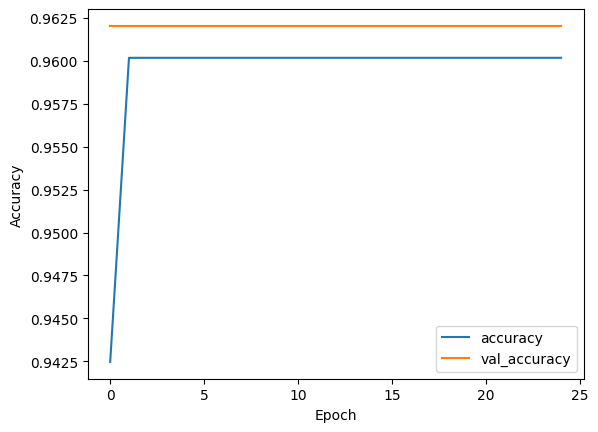

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.9544138929088278
F1 Score: 0.9544102911355163
Precision: 0.9560715696693123
Recall: 0.9544138929088278
AUC: 0.973658100586993


### 50 epochs

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.1)

Epoch 1/50
156/156 [==============================] - 2s 5ms/step - loss: 0.4981 - accuracy: 0.9409 - val_loss: 0.1998 - val_accuracy: 0.9620
Epoch 2/50
156/156 [==============================] - 0s 3ms/step - loss: 0.2011 - accuracy: 0.9602 - val_loss: 0.1940 - val_accuracy: 0.9620
Epoch 3/50
156/156 [==============================] - 0s 3ms/step - loss: 0.1996 - accuracy: 0.9602 - val_loss: 0.1953 - val_accuracy: 0.9620
Epoch 4/50
156/156 [==============================] - 0s 3ms/step - loss: 0.2002 - accuracy: 0.9602 - val_loss: 0.1944 - val_accuracy: 0.9620
Epoch 5/50
156/156 [==============================] - 0s 2ms/step - loss: 0.1994 - accuracy: 0.9602 - val_loss: 0.1931 - val_accuracy: 0.9620
Epoch 6/50
156/156 [==============================] - 0s 2ms/step - loss: 0.2001 - accuracy: 0.9602 - val_loss: 0.1924 - val_accuracy: 0.9620
Epoch 7/50
156/156 [==============================] - 0s 3ms/step - loss: 0.1994 - accuracy: 0.9602 - val_loss: 0.1935 - val_accuracy: 0.9620
Epoch 

44/44 [==============================] - 0s 2ms/step - loss: 0.2212 - accuracy: 0.9544
Test Accuracy: 0.954413890838623


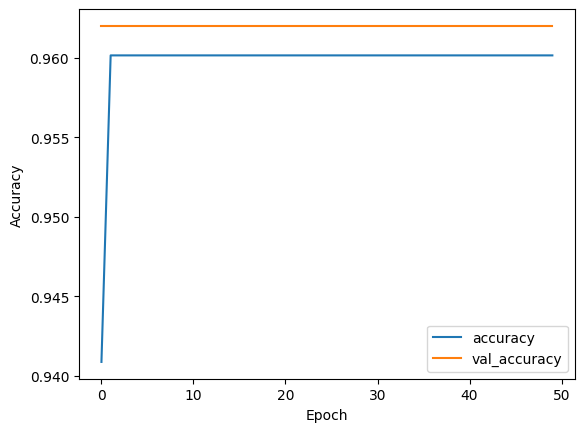

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.9544138929088278
F1 Score: 0.9544102911355163
Precision: 0.9560715696693123
Recall: 0.9544138929088278
AUC: 0.9739537023304073


### 100 epochs

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.1)

Epoch 1/100
156/156 [==============================] - 2s 6ms/step - loss: 0.5521 - accuracy: 0.9230 - val_loss: 0.1990 - val_accuracy: 0.9620
Epoch 2/100
156/156 [==============================] - 1s 4ms/step - loss: 0.2018 - accuracy: 0.9602 - val_loss: 0.1937 - val_accuracy: 0.9620
Epoch 3/100
156/156 [==============================] - 1s 5ms/step - loss: 0.2003 - accuracy: 0.9602 - val_loss: 0.1945 - val_accuracy: 0.9620
Epoch 4/100
156/156 [==============================] - 1s 5ms/step - loss: 0.2003 - accuracy: 0.9602 - val_loss: 0.1940 - val_accuracy: 0.9620
Epoch 5/100
156/156 [==============================] - 0s 3ms/step - loss: 0.1992 - accuracy: 0.9602 - val_loss: 0.1953 - val_accuracy: 0.9620
Epoch 6/100
156/156 [==============================] - 0s 2ms/step - loss: 0.1994 - accuracy: 0.9602 - val_loss: 0.1931 - val_accuracy: 0.9620
Epoch 7/100
156/156 [==============================] - 0s 3ms/step - loss: 0.1987 - accuracy: 0.9602 - val_loss: 0.1964 - val_accuracy: 0.9620

44/44 [==============================] - 0s 2ms/step - loss: 0.2208 - accuracy: 0.9544
Test Accuracy: 0.954413890838623


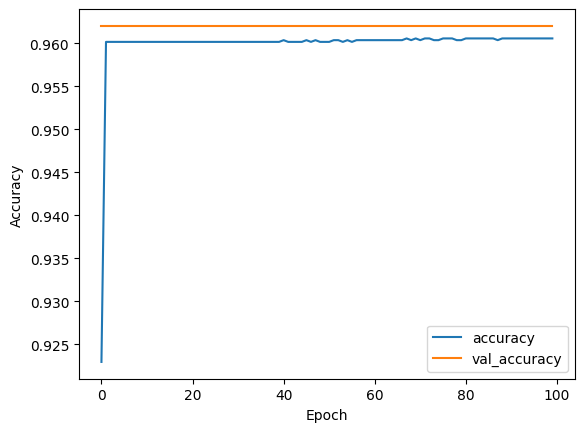

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 1ms/step
Accuracy: 0.9544138929088278
F1 Score: 0.9544102911355163
Precision: 0.9560715696693123
Recall: 0.9544138929088278
AUC: 0.9738619632802308


### 200 Epoach

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=200, batch_size=32, validation_split=0.1)

Epoch 1/200
156/156 [==============================] - 1s 4ms/step - loss: 0.5737 - accuracy: 0.8932 - val_loss: 0.2015 - val_accuracy: 0.9620
Epoch 2/200
156/156 [==============================] - 0s 2ms/step - loss: 0.2040 - accuracy: 0.9602 - val_loss: 0.1952 - val_accuracy: 0.9620
Epoch 3/200
156/156 [==============================] - 0s 3ms/step - loss: 0.2005 - accuracy: 0.9602 - val_loss: 0.1940 - val_accuracy: 0.9620
Epoch 4/200
156/156 [==============================] - 0s 3ms/step - loss: 0.2008 - accuracy: 0.9602 - val_loss: 0.1937 - val_accuracy: 0.9620
Epoch 5/200
156/156 [==============================] - 0s 3ms/step - loss: 0.1999 - accuracy: 0.9602 - val_loss: 0.1941 - val_accuracy: 0.9620
Epoch 6/200
156/156 [==============================] - 0s 3ms/step - loss: 0.1997 - accuracy: 0.9602 - val_loss: 0.1943 - val_accuracy: 0.9620
Epoch 7/200
156/156 [==============================] - 0s 3ms/step - loss: 0.1992 - accuracy: 0.9602 - val_loss: 0.1935 - val_accuracy: 0.9620

44/44 [==============================] - 0s 3ms/step - loss: 0.2181 - accuracy: 0.9544
Test Accuracy: 0.954413890838623


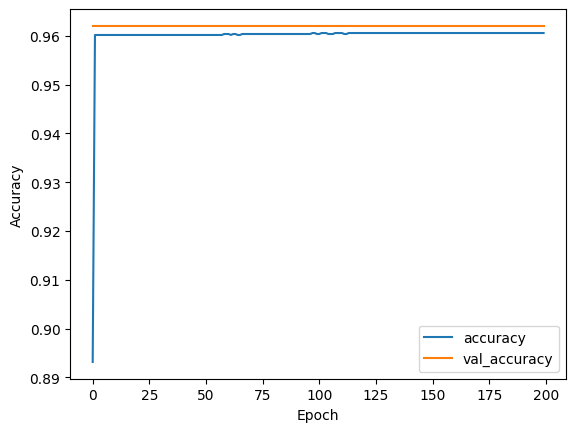

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.9544138929088278
F1 Score: 0.9544102911355163
Precision: 0.9560715696693123
Recall: 0.9544138929088278
AUC: 0.9738005216677214


### 300 Epoch

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=300, batch_size=32, validation_split=0.1)

Epoch 1/300
156/156 [==============================] - 2s 4ms/step - loss: 0.5327 - accuracy: 0.9177 - val_loss: 0.2005 - val_accuracy: 0.9620
Epoch 2/300
156/156 [==============================] - 0s 2ms/step - loss: 0.2009 - accuracy: 0.9602 - val_loss: 0.1946 - val_accuracy: 0.9620
Epoch 3/300
156/156 [==============================] - 0s 3ms/step - loss: 0.2006 - accuracy: 0.9602 - val_loss: 0.1943 - val_accuracy: 0.9620
Epoch 4/300
156/156 [==============================] - 0s 2ms/step - loss: 0.2005 - accuracy: 0.9602 - val_loss: 0.1951 - val_accuracy: 0.9620
Epoch 5/300
156/156 [==============================] - 0s 3ms/step - loss: 0.1991 - accuracy: 0.9602 - val_loss: 0.1940 - val_accuracy: 0.9620
Epoch 6/300
156/156 [==============================] - 0s 2ms/step - loss: 0.1991 - accuracy: 0.9602 - val_loss: 0.1971 - val_accuracy: 0.9620
Epoch 7/300
156/156 [==============================] - 0s 3ms/step - loss: 0.1997 - accuracy: 0.9602 - val_loss: 0.1959 - val_accuracy: 0.9620

44/44 [==============================] - 0s 2ms/step - loss: 0.2179 - accuracy: 0.9559
Test Accuracy: 0.9558610916137695


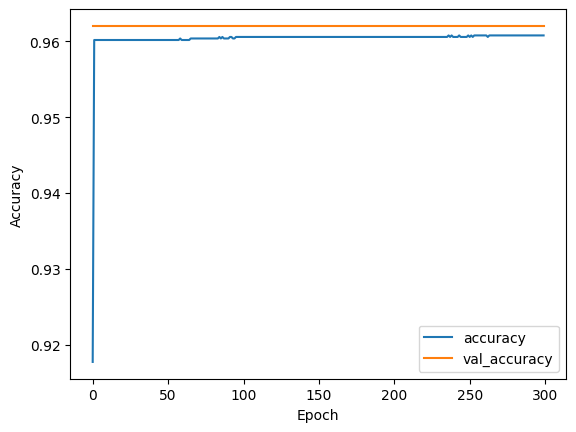

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 1ms/step
Accuracy: 0.9558610709117221
F1 Score: 0.9558217330836802
Precision: 0.957331123106704
Recall: 0.9558610709117221
AUC: 0.9738050191857455


### 500 epochs

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=500, batch_size=32, validation_split=0.1)

Epoch 1/500
156/156 [==============================] - 1s 4ms/step - loss: 0.5206 - accuracy: 0.9209 - val_loss: 0.1965 - val_accuracy: 0.9620
Epoch 2/500
156/156 [==============================] - 0s 3ms/step - loss: 0.2015 - accuracy: 0.9602 - val_loss: 0.1944 - val_accuracy: 0.9620
Epoch 3/500
156/156 [==============================] - 0s 3ms/step - loss: 0.1998 - accuracy: 0.9602 - val_loss: 0.1939 - val_accuracy: 0.9620
Epoch 4/500
156/156 [==============================] - 0s 2ms/step - loss: 0.2001 - accuracy: 0.9602 - val_loss: 0.1953 - val_accuracy: 0.9620
Epoch 5/500
156/156 [==============================] - 0s 2ms/step - loss: 0.2004 - accuracy: 0.9602 - val_loss: 0.1937 - val_accuracy: 0.9620
Epoch 6/500
156/156 [==============================] - 0s 2ms/step - loss: 0.1997 - accuracy: 0.9602 - val_loss: 0.1931 - val_accuracy: 0.9620
Epoch 7/500
156/156 [==============================] - 0s 3ms/step - loss: 0.1994 - accuracy: 0.9602 - val_loss: 0.1933 - val_accuracy: 0.9620

44/44 [==============================] - 0s 7ms/step - loss: 0.2178 - accuracy: 0.9559
Test Accuracy: 0.9558610916137695


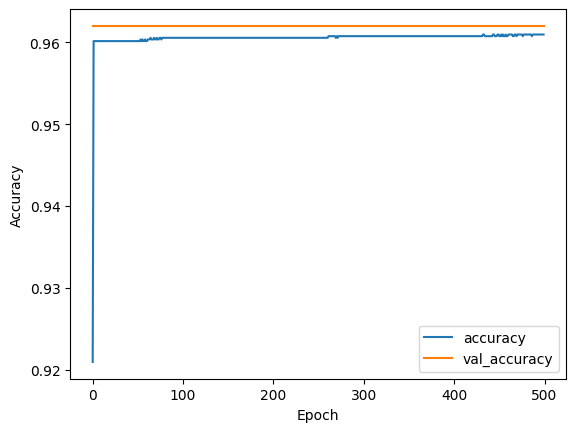

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 3ms/step
Accuracy: 0.9558610709117221
F1 Score: 0.9558217330836802
Precision: 0.957331123106704
Recall: 0.9558610709117221
AUC: 0.9736900705061274


### 1000 Epochs

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 3s 9ms/step - loss: 0.4627 - accuracy: 0.9461 - val_loss: 0.1979 - val_accuracy: 0.9620
Epoch 2/1000
156/156 [==============================] - 1s 5ms/step - loss: 0.2012 - accuracy: 0.9602 - val_loss: 0.1962 - val_accuracy: 0.9620
Epoch 3/1000
156/156 [==============================] - 1s 5ms/step - loss: 0.2008 - accuracy: 0.9602 - val_loss: 0.1935 - val_accuracy: 0.9620
Epoch 4/1000
156/156 [==============================] - 1s 5ms/step - loss: 0.2002 - accuracy: 0.9602 - val_loss: 0.1945 - val_accuracy: 0.9620
Epoch 5/1000
156/156 [==============================] - 1s 5ms/step - loss: 0.1996 - accuracy: 0.9602 - val_loss: 0.1958 - val_accuracy: 0.9620
Epoch 6/1000
156/156 [==============================] - 1s 5ms/step - loss: 0.1997 - accuracy: 0.9602 - val_loss: 0.1943 - val_accuracy: 0.9620
Epoch 7/1000
156/156 [==============================] - 1s 6ms/step - loss: 0.1993 - accuracy: 0.9602 - val_loss: 0.1954 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 0.2195 - accuracy: 0.9559
Test Accuracy: 0.9558610916137695


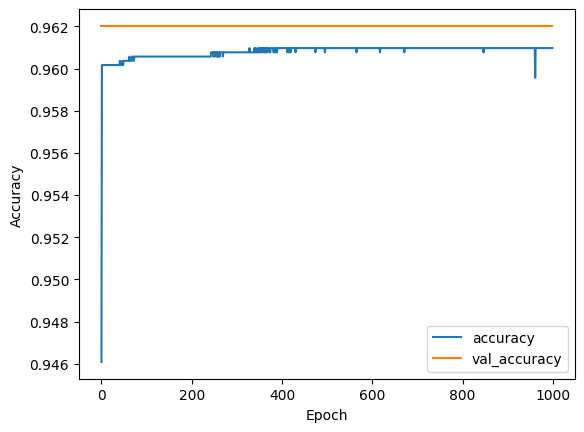

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.9558610709117221
F1 Score: 0.9558217330836802
Precision: 0.957331123106704
Recall: 0.9558610709117221
AUC: 0.9736989030013463


## CNN Optimization Method

###  Optimization Method - Adam

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 3s 9ms/step - loss: 0.4627 - accuracy: 0.9461 - val_loss: 0.1979 - val_accuracy: 0.9620
Epoch 2/1000
156/156 [==============================] - 1s 5ms/step - loss: 0.2012 - accuracy: 0.9602 - val_loss: 0.1962 - val_accuracy: 0.9620
Epoch 3/1000
156/156 [==============================] - 1s 5ms/step - loss: 0.2008 - accuracy: 0.9602 - val_loss: 0.1935 - val_accuracy: 0.9620
Epoch 4/1000
156/156 [==============================] - 1s 5ms/step - loss: 0.2002 - accuracy: 0.9602 - val_loss: 0.1945 - val_accuracy: 0.9620
Epoch 5/1000
156/156 [==============================] - 1s 5ms/step - loss: 0.1996 - accuracy: 0.9602 - val_loss: 0.1958 - val_accuracy: 0.9620
Epoch 6/1000
156/156 [==============================] - 1s 5ms/step - loss: 0.1997 - accuracy: 0.9602 - val_loss: 0.1943 - val_accuracy: 0.9620
Epoch 7/1000
156/156 [==============================] - 1s 6ms/step - loss: 0.1993 - accuracy: 0.9602 - val_loss: 0.1954 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 0.2195 - accuracy: 0.9559
Test Accuracy: 0.9558610916137695


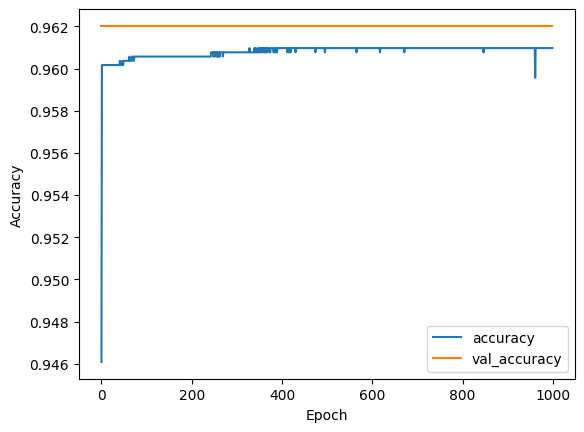

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.9558610709117221
F1 Score: 0.9558217330836802
Precision: 0.957331123106704
Recall: 0.9558610709117221
AUC: 0.9736989030013463


###  Optimization Method - SGD (Stochastic Gradient Descent)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import SGD

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer=SGD(), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 3s 9ms/step - loss: 1.0966 - accuracy: 0.7351 - val_loss: 0.8523 - val_accuracy: 0.8481
Epoch 2/1000
156/156 [==============================] - 1s 4ms/step - loss: 0.6591 - accuracy: 0.8527 - val_loss: 0.5103 - val_accuracy: 0.8499
Epoch 3/1000
156/156 [==============================] - 1s 4ms/step - loss: 0.4241 - accuracy: 0.9175 - val_loss: 0.3625 - val_accuracy: 0.9620
Epoch 4/1000
156/156 [==============================] - 1s 4ms/step - loss: 0.3251 - accuracy: 0.9602 - val_loss: 0.2938 - val_accuracy: 0.9620
Epoch 5/1000
156/156 [==============================] - 1s 4ms/step - loss: 0.2735 - accuracy: 0.9602 - val_loss: 0.2537 - val_accuracy: 0.9620
Epoch 6/1000
156/156 [==============================] - 1s 5ms/step - loss: 0.2431 - accuracy: 0.9602 - val_loss: 0.2307 - val_accuracy: 0.9620
Epoch 7/1000
156/156 [==============================] - 1s 4ms/step - loss: 0.2259 - accuracy: 0.9602 - val_loss: 0.2174 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 0.2201 - accuracy: 0.9544
Test Accuracy: 0.954413890838623


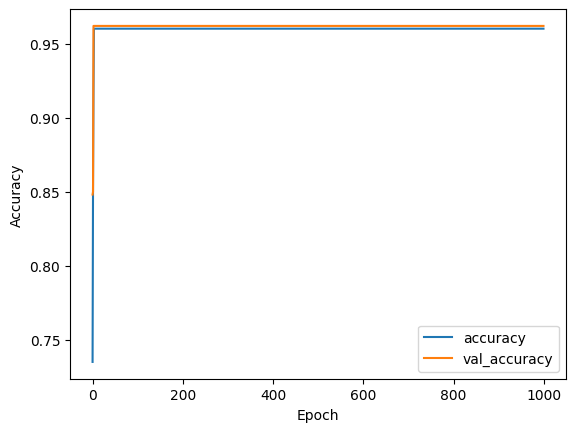

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.9544138929088278
F1 Score: 0.9544102911355163
Precision: 0.9560715696693123
Recall: 0.9544138929088278
AUC: 0.9740138786632626


###  Optimization Method - RMSprop (Root Mean Squared Propagation)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import RMSprop

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer=RMSprop(), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 4ms/step - loss: 0.4345 - accuracy: 0.9443 - val_loss: 0.1977 - val_accuracy: 0.9620
Epoch 2/1000
156/156 [==============================] - 0s 3ms/step - loss: 0.2008 - accuracy: 0.9602 - val_loss: 0.1970 - val_accuracy: 0.9620
Epoch 3/1000
156/156 [==============================] - 0s 2ms/step - loss: 0.2005 - accuracy: 0.9602 - val_loss: 0.1954 - val_accuracy: 0.9620
Epoch 4/1000
156/156 [==============================] - 0s 2ms/step - loss: 0.1997 - accuracy: 0.9602 - val_loss: 0.1947 - val_accuracy: 0.9620
Epoch 5/1000
156/156 [==============================] - 0s 2ms/step - loss: 0.2004 - accuracy: 0.9602 - val_loss: 0.1951 - val_accuracy: 0.9620
Epoch 6/1000
156/156 [==============================] - 0s 2ms/step - loss: 0.2010 - accuracy: 0.9602 - val_loss: 0.1935 - val_accuracy: 0.9620
Epoch 7/1000
156/156 [==============================] - 0s 2ms/step - loss: 0.1999 - accuracy: 0.9602 - val_loss: 0.1955 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 0.2609 - accuracy: 0.9544
Test Accuracy: 0.954413890838623


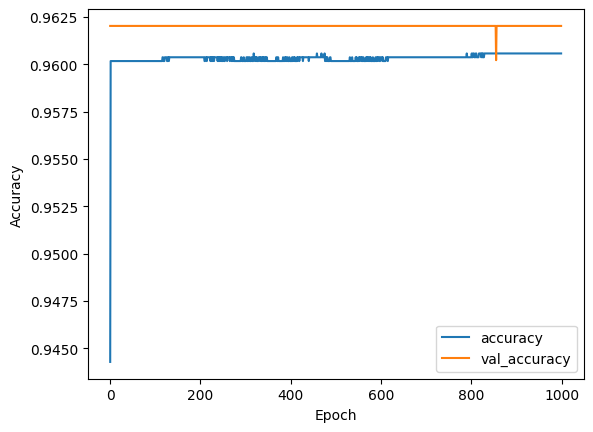

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 1ms/step
Accuracy: 0.9544138929088278
F1 Score: 0.9544102911355163
Precision: 0.9560715696693123
Recall: 0.9544138929088278
AUC: 0.9674850267415268


## CNN Learning Rate

###  Learning Rate 0.1

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Create custom optimizer with learning rate 0.1
custom_optimizer = Adam(learning_rate=0.1)

model.compile(optimizer=custom_optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 2s 7ms/step - loss: 0.2964 - accuracy: 0.9509 - val_loss: 0.2436 - val_accuracy: 0.9620
Epoch 2/1000
156/156 [==============================] - 1s 5ms/step - loss: 0.2284 - accuracy: 0.9602 - val_loss: 0.3133 - val_accuracy: 0.9620
Epoch 3/1000
156/156 [==============================] - 0s 3ms/step - loss: 0.2235 - accuracy: 0.9602 - val_loss: 0.2005 - val_accuracy: 0.9620
Epoch 4/1000
156/156 [==============================] - 0s 3ms/step - loss: 0.2126 - accuracy: 0.9602 - val_loss: 0.1978 - val_accuracy: 0.9620
Epoch 5/1000
156/156 [==============================] - 0s 2ms/step - loss: 0.2150 - accuracy: 0.9602 - val_loss: 0.2156 - val_accuracy: 0.9620
Epoch 6/1000
156/156 [==============================] - 0s 2ms/step - loss: 0.2108 - accuracy: 0.9602 - val_loss: 0.2017 - val_accuracy: 0.9620
Epoch 7/1000
156/156 [==============================] - 0s 3ms/step - loss: 0.2094 - accuracy: 0.9602 - val_loss: 0.2080 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 0.4468 - accuracy: 0.8415
Test Accuracy: 0.8415340185165405


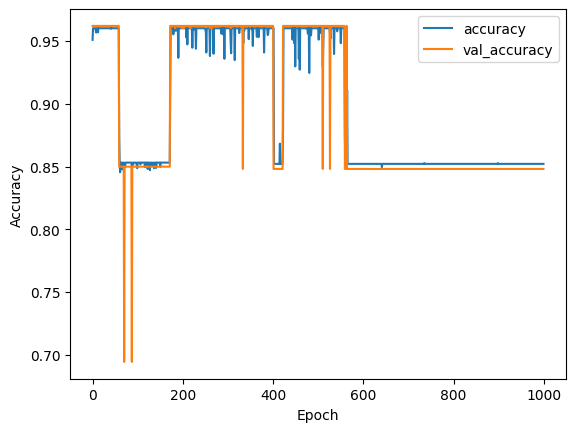

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 1ms/step
Accuracy: 0.841534008683068
F1 Score: 0.7920911021354209
Precision: 0.7604988635226874
Recall: 0.841534008683068
AUC: 0.9194354836330176


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


###  Learning Rate 0.01

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Create custom optimizer with learning rate 0.01
custom_optimizer = Adam(learning_rate=0.01)

model.compile(optimizer=custom_optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 4ms/step - loss: 0.2498 - accuracy: 0.9574 - val_loss: 0.2035 - val_accuracy: 0.9620
Epoch 2/1000
156/156 [==============================] - 0s 2ms/step - loss: 0.2094 - accuracy: 0.9602 - val_loss: 0.2106 - val_accuracy: 0.9620
Epoch 3/1000
156/156 [==============================] - 0s 2ms/step - loss: 0.2093 - accuracy: 0.9602 - val_loss: 0.2060 - val_accuracy: 0.9620
Epoch 4/1000
156/156 [==============================] - 0s 2ms/step - loss: 0.2078 - accuracy: 0.9602 - val_loss: 0.2046 - val_accuracy: 0.9620
Epoch 5/1000
156/156 [==============================] - 0s 2ms/step - loss: 0.2079 - accuracy: 0.9602 - val_loss: 0.2045 - val_accuracy: 0.9620
Epoch 6/1000
156/156 [==============================] - 0s 2ms/step - loss: 0.2086 - accuracy: 0.9602 - val_loss: 0.2031 - val_accuracy: 0.9620
Epoch 7/1000
156/156 [==============================] - 0s 2ms/step - loss: 0.2083 - accuracy: 0.9602 - val_loss: 0.2040 - val_accuracy:

44/44 [==============================] - 0s 3ms/step - loss: 0.2203 - accuracy: 0.9551
Test Accuracy: 0.9551374912261963


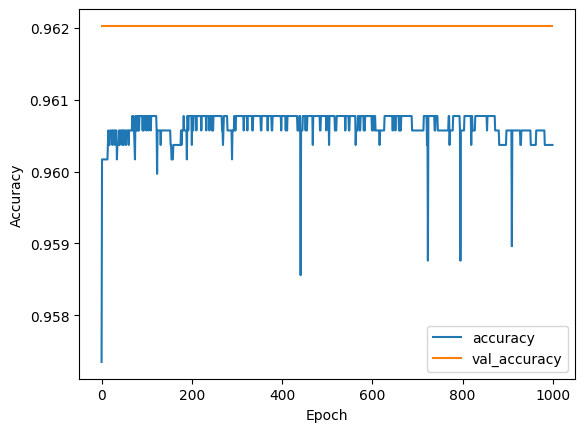

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 3ms/step
Accuracy: 0.9551374819102749
F1 Score: 0.955090085899394
Precision: 0.9565099808215539
Recall: 0.9551374819102749
AUC: 0.9727614454337751


###  Learning Rate 0.001

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Create custom optimizer with learning rate 0.001
custom_optimizer = Adam(learning_rate=0.001)

model.compile(optimizer=custom_optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 4ms/step - loss: 0.5588 - accuracy: 0.8978 - val_loss: 0.1964 - val_accuracy: 0.9620
Epoch 2/1000
156/156 [==============================] - 0s 3ms/step - loss: 0.2014 - accuracy: 0.9602 - val_loss: 0.1948 - val_accuracy: 0.9620
Epoch 3/1000
156/156 [==============================] - 0s 3ms/step - loss: 0.2011 - accuracy: 0.9602 - val_loss: 0.1948 - val_accuracy: 0.9620
Epoch 4/1000
156/156 [==============================] - 0s 3ms/step - loss: 0.2005 - accuracy: 0.9602 - val_loss: 0.1968 - val_accuracy: 0.9620
Epoch 5/1000
156/156 [==============================] - 1s 4ms/step - loss: 0.2005 - accuracy: 0.9602 - val_loss: 0.1978 - val_accuracy: 0.9620
Epoch 6/1000
156/156 [==============================] - 1s 4ms/step - loss: 0.2000 - accuracy: 0.9602 - val_loss: 0.1937 - val_accuracy: 0.9620
Epoch 7/1000
156/156 [==============================] - 1s 4ms/step - loss: 0.2006 - accuracy: 0.9602 - val_loss: 0.1923 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 0.2201 - accuracy: 0.9559
Test Accuracy: 0.9558610916137695


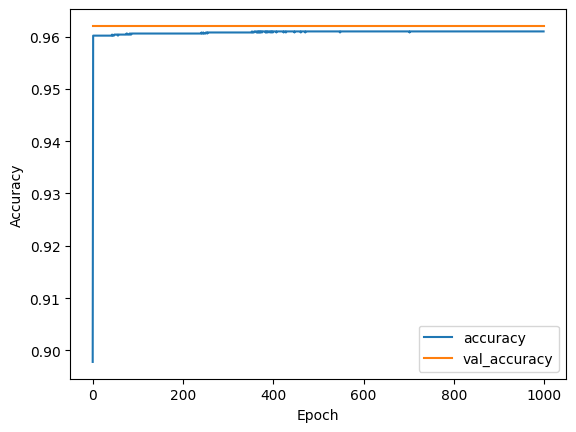

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.9558610709117221
F1 Score: 0.9558217330836802
Precision: 0.957331123106704
Recall: 0.9558610709117221
AUC: 0.9734286723799019


###  Learning Rate 0.0001

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Create custom optimizer with learning rate 0.0001
custom_optimizer = Adam(learning_rate=0.0001)

model.compile(optimizer=custom_optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 4ms/step - loss: 1.3152 - accuracy: 0.5637 - val_loss: 1.1977 - val_accuracy: 0.9620
Epoch 2/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.0795 - accuracy: 0.9602 - val_loss: 0.9519 - val_accuracy: 0.9620
Epoch 3/1000
156/156 [==============================] - 0s 2ms/step - loss: 0.8220 - accuracy: 0.9602 - val_loss: 0.6905 - val_accuracy: 0.9620
Epoch 4/1000
156/156 [==============================] - 0s 3ms/step - loss: 0.5779 - accuracy: 0.9602 - val_loss: 0.4734 - val_accuracy: 0.9620
Epoch 5/1000
156/156 [==============================] - 0s 2ms/step - loss: 0.4016 - accuracy: 0.9602 - val_loss: 0.3368 - val_accuracy: 0.9620
Epoch 6/1000
156/156 [==============================] - 0s 3ms/step - loss: 0.3003 - accuracy: 0.9602 - val_loss: 0.2648 - val_accuracy: 0.9620
Epoch 7/1000
156/156 [==============================] - 0s 3ms/step - loss: 0.2490 - accuracy: 0.9602 - val_loss: 0.2288 - val_accuracy:

44/44 [==============================] - 0s 1ms/step - loss: 0.2190 - accuracy: 0.9544
Test Accuracy: 0.954413890838623


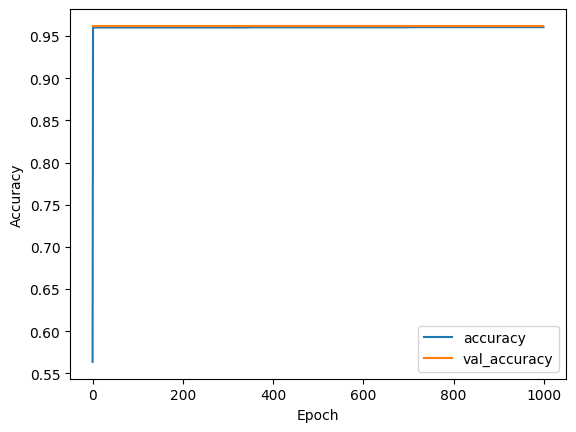

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.9544138929088278
F1 Score: 0.9544102911355163
Precision: 0.9560715696693123
Recall: 0.9544138929088278
AUC: 0.9739104459570675


###  Learning Rate 0.00001

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Create custom optimizer with learning rate 0.00001
custom_optimizer = Adam(learning_rate=0.00001)

model.compile(optimizer=custom_optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 4ms/step - loss: 1.3420 - accuracy: 0.5769 - val_loss: 1.3281 - val_accuracy: 0.5967
Epoch 2/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.3128 - accuracy: 0.6063 - val_loss: 1.2999 - val_accuracy: 0.5967
Epoch 3/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2848 - accuracy: 0.6063 - val_loss: 1.2720 - val_accuracy: 0.5967
Epoch 4/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.2572 - accuracy: 0.8059 - val_loss: 1.2449 - val_accuracy: 0.8481
Epoch 5/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.2303 - accuracy: 0.8521 - val_loss: 1.2185 - val_accuracy: 0.8481
Epoch 6/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2041 - accuracy: 0.8521 - val_loss: 1.1925 - val_accuracy: 0.8481
Epoch 7/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.1779 - accuracy: 0.9191 - val_loss: 1.1664 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 0.2204 - accuracy: 0.9544
Test Accuracy: 0.954413890838623


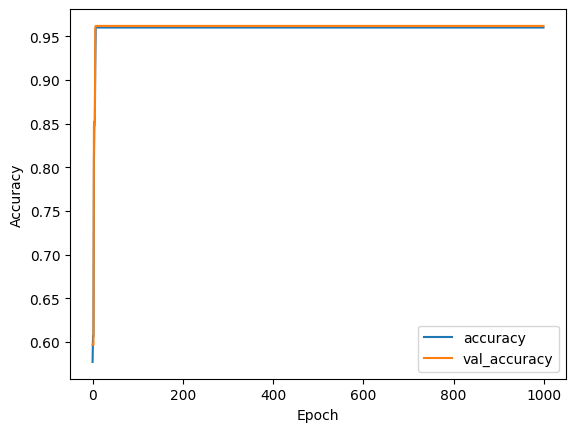

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.9544138929088278
F1 Score: 0.9544102911355163
Precision: 0.9560715696693123
Recall: 0.9544138929088278
AUC: 0.973816256762696


## Mobile Segmentation Model

### 25 Epochs

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=25, batch_size=32, validation_split=0.1)

Epoch 1/25
156/156 [==============================] - 3s 7ms/step - loss: 1.3023 - accuracy: 0.3655 - val_loss: 1.2772 - val_accuracy: 0.3996
Epoch 2/25
156/156 [==============================] - 1s 7ms/step - loss: 1.2760 - accuracy: 0.3866 - val_loss: 1.2740 - val_accuracy: 0.4159
Epoch 3/25
156/156 [==============================] - 1s 9ms/step - loss: 1.2739 - accuracy: 0.3925 - val_loss: 1.2706 - val_accuracy: 0.4051
Epoch 4/25
156/156 [==============================] - 1s 8ms/step - loss: 1.2728 - accuracy: 0.3939 - val_loss: 1.2699 - val_accuracy: 0.4033
Epoch 5/25
156/156 [==============================] - 1s 9ms/step - loss: 1.2707 - accuracy: 0.3967 - val_loss: 1.2689 - val_accuracy: 0.4051
Epoch 6/25
156/156 [==============================] - 1s 5ms/step - loss: 1.2699 - accuracy: 0.3941 - val_loss: 1.2662 - val_accuracy: 0.4123
Epoch 7/25
156/156 [==============================] - 1s 5ms/step - loss: 1.2672 - accuracy: 0.3991 - val_loss: 1.2676 - val_accuracy: 0.4069
Epoch 

44/44 [==============================] - 0s 2ms/step - loss: 1.2408 - accuracy: 0.4450
Test Accuracy: 0.44500723481178284


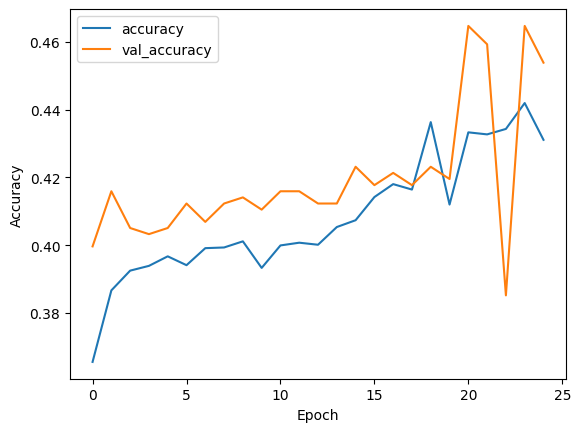

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.44500723589001445
F1 Score: 0.4022241603670794
Precision: 0.39926428779921574
Recall: 0.44500723589001445
AUC: 0.6517477463366784


### 50 epochs

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.1)

Epoch 1/50
156/156 [==============================] - 2s 4ms/step - loss: 1.2970 - accuracy: 0.3770 - val_loss: 1.2795 - val_accuracy: 0.3942
Epoch 2/50
156/156 [==============================] - 1s 4ms/step - loss: 1.2752 - accuracy: 0.3868 - val_loss: 1.2751 - val_accuracy: 0.4123
Epoch 3/50
156/156 [==============================] - 0s 3ms/step - loss: 1.2723 - accuracy: 0.3903 - val_loss: 1.2724 - val_accuracy: 0.3942
Epoch 4/50
156/156 [==============================] - 1s 3ms/step - loss: 1.2713 - accuracy: 0.3921 - val_loss: 1.2725 - val_accuracy: 0.4087
Epoch 5/50
156/156 [==============================] - 1s 3ms/step - loss: 1.2694 - accuracy: 0.3921 - val_loss: 1.2702 - val_accuracy: 0.4014
Epoch 6/50
156/156 [==============================] - 1s 3ms/step - loss: 1.2684 - accuracy: 0.3967 - val_loss: 1.2678 - val_accuracy: 0.4033
Epoch 7/50
156/156 [==============================] - 0s 3ms/step - loss: 1.2671 - accuracy: 0.3963 - val_loss: 1.2671 - val_accuracy: 0.4051
Epoch 

44/44 [==============================] - 0s 4ms/step - loss: 1.1928 - accuracy: 0.4436
Test Accuracy: 0.44356006383895874


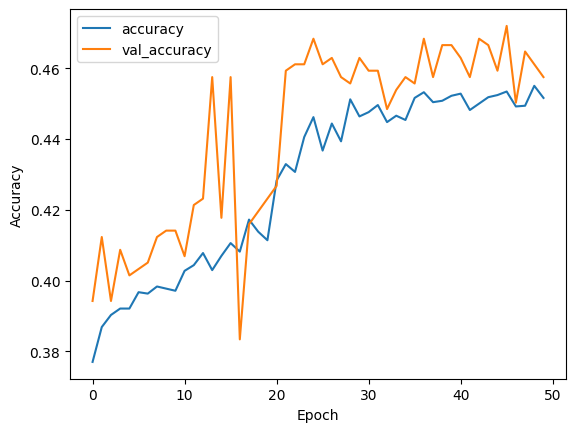

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 3ms/step
Accuracy: 0.4435600578871201
F1 Score: 0.4089831916597128
Precision: 0.46746299595588703
Recall: 0.4435600578871201
AUC: 0.6719935935456073


### 100 epochs

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.1)

Epoch 1/100
156/156 [==============================] - 2s 6ms/step - loss: 1.2994 - accuracy: 0.3804 - val_loss: 1.2809 - val_accuracy: 0.4069
Epoch 2/100
156/156 [==============================] - 1s 5ms/step - loss: 1.2770 - accuracy: 0.3846 - val_loss: 1.2744 - val_accuracy: 0.4123
Epoch 3/100
156/156 [==============================] - 1s 5ms/step - loss: 1.2743 - accuracy: 0.3810 - val_loss: 1.2725 - val_accuracy: 0.4014
Epoch 4/100
156/156 [==============================] - 1s 5ms/step - loss: 1.2718 - accuracy: 0.3923 - val_loss: 1.2712 - val_accuracy: 0.4177
Epoch 5/100
156/156 [==============================] - 1s 5ms/step - loss: 1.2702 - accuracy: 0.3941 - val_loss: 1.2676 - val_accuracy: 0.4069
Epoch 6/100
156/156 [==============================] - 1s 4ms/step - loss: 1.2680 - accuracy: 0.3961 - val_loss: 1.2675 - val_accuracy: 0.4123
Epoch 7/100
156/156 [==============================] - 1s 6ms/step - loss: 1.2672 - accuracy: 0.3991 - val_loss: 1.2621 - val_accuracy: 0.4123

44/44 [==============================] - 0s 4ms/step - loss: 1.1842 - accuracy: 0.4479
Test Accuracy: 0.4479016065597534


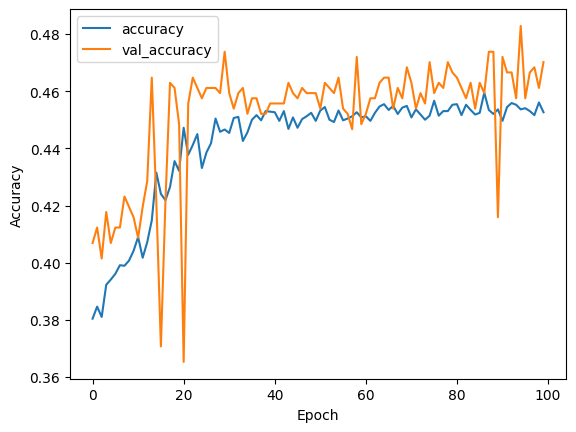

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.4479015918958032
F1 Score: 0.4134267436879392
Precision: 0.4537921659954405
Recall: 0.4479015918958032
AUC: 0.676973018779164


### 200 Epoach

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=200, batch_size=32, validation_split=0.1)

Epoch 1/200
156/156 [==============================] - 2s 4ms/step - loss: 1.2903 - accuracy: 0.3784 - val_loss: 1.2769 - val_accuracy: 0.4087
Epoch 2/200
156/156 [==============================] - 1s 3ms/step - loss: 1.2761 - accuracy: 0.3862 - val_loss: 1.2769 - val_accuracy: 0.4250
Epoch 3/200
156/156 [==============================] - 0s 3ms/step - loss: 1.2744 - accuracy: 0.3897 - val_loss: 1.2784 - val_accuracy: 0.4087
Epoch 4/200
156/156 [==============================] - 1s 3ms/step - loss: 1.2714 - accuracy: 0.3897 - val_loss: 1.2704 - val_accuracy: 0.3960
Epoch 5/200
156/156 [==============================] - 1s 3ms/step - loss: 1.2705 - accuracy: 0.3935 - val_loss: 1.2683 - val_accuracy: 0.4051
Epoch 6/200
156/156 [==============================] - 1s 3ms/step - loss: 1.2689 - accuracy: 0.3945 - val_loss: 1.2686 - val_accuracy: 0.4087
Epoch 7/200
156/156 [==============================] - 1s 3ms/step - loss: 1.2675 - accuracy: 0.3949 - val_loss: 1.2698 - val_accuracy: 0.3996

44/44 [==============================] - 0s 3ms/step - loss: 1.1856 - accuracy: 0.4493
Test Accuracy: 0.4493487775325775


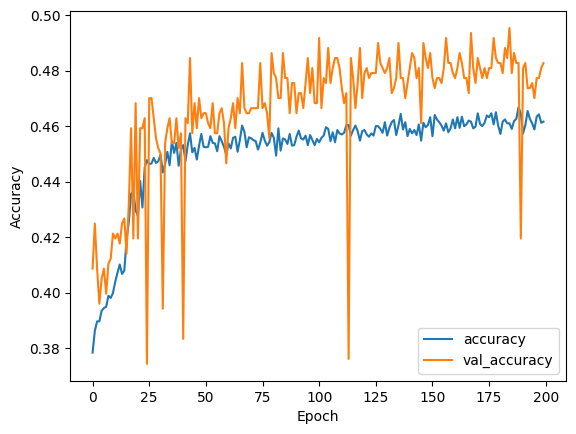

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 3ms/step
Accuracy: 0.44934876989869754
F1 Score: 0.41998250818870675
Precision: 0.4767008799208509
Recall: 0.44934876989869754
AUC: 0.6779279220152192


### 300 Epoch

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=300, batch_size=32, validation_split=0.1)

Epoch 1/300
156/156 [==============================] - 30s 5ms/step - loss: 1.2997 - accuracy: 0.3780 - val_loss: 1.2793 - val_accuracy: 0.4105
Epoch 2/300
156/156 [==============================] - 1s 4ms/step - loss: 1.2759 - accuracy: 0.3832 - val_loss: 1.2760 - val_accuracy: 0.4033
Epoch 3/300
156/156 [==============================] - 1s 4ms/step - loss: 1.2742 - accuracy: 0.3889 - val_loss: 1.2719 - val_accuracy: 0.4033
Epoch 4/300
156/156 [==============================] - 1s 3ms/step - loss: 1.2720 - accuracy: 0.3921 - val_loss: 1.2715 - val_accuracy: 0.3942
Epoch 5/300
156/156 [==============================] - 1s 3ms/step - loss: 1.2721 - accuracy: 0.3885 - val_loss: 1.2700 - val_accuracy: 0.3942
Epoch 6/300
156/156 [==============================] - 1s 3ms/step - loss: 1.2697 - accuracy: 0.3977 - val_loss: 1.2666 - val_accuracy: 0.4051
Epoch 7/300
156/156 [==============================] - 1s 3ms/step - loss: 1.2672 - accuracy: 0.3987 - val_loss: 1.2657 - val_accuracy: 0.410

44/44 [==============================] - 0s 3ms/step - loss: 1.1828 - accuracy: 0.4479
Test Accuracy: 0.4479016065597534


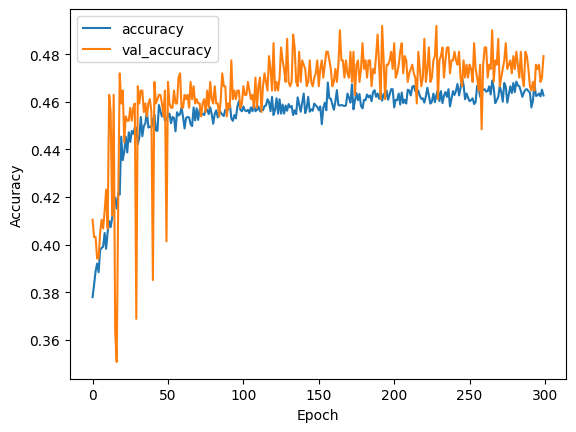

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.4479015918958032
F1 Score: 0.42219846516306403
Precision: 0.4760814740887657
Recall: 0.4479015918958032
AUC: 0.6759494673141451


### 500 epochs

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=500, batch_size=32, validation_split=0.1)

Epoch 1/500
156/156 [==============================] - 2s 5ms/step - loss: 1.3010 - accuracy: 0.3565 - val_loss: 1.2784 - val_accuracy: 0.3888
Epoch 2/500
156/156 [==============================] - 1s 5ms/step - loss: 1.2747 - accuracy: 0.3905 - val_loss: 1.2765 - val_accuracy: 0.4033
Epoch 3/500
156/156 [==============================] - 1s 4ms/step - loss: 1.2738 - accuracy: 0.3897 - val_loss: 1.2724 - val_accuracy: 0.3978
Epoch 4/500
156/156 [==============================] - 1s 5ms/step - loss: 1.2721 - accuracy: 0.3893 - val_loss: 1.2731 - val_accuracy: 0.4087
Epoch 5/500
156/156 [==============================] - 1s 4ms/step - loss: 1.2715 - accuracy: 0.3889 - val_loss: 1.2720 - val_accuracy: 0.4051
Epoch 6/500
156/156 [==============================] - 1s 3ms/step - loss: 1.2696 - accuracy: 0.3947 - val_loss: 1.2685 - val_accuracy: 0.4014
Epoch 7/500
156/156 [==============================] - 1s 3ms/step - loss: 1.2677 - accuracy: 0.3915 - val_loss: 1.2755 - val_accuracy: 0.3400

44/44 [==============================] - 0s 2ms/step - loss: 1.1875 - accuracy: 0.4493
Test Accuracy: 0.4493487775325775


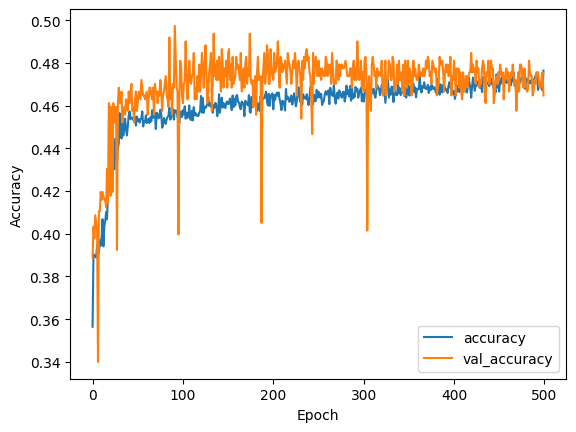

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.44934876989869754
F1 Score: 0.4154088882943902
Precision: 0.4869995665047743
Recall: 0.44934876989869754
AUC: 0.6785446882294477


### 1000 Epochs

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 2s 4ms/step - loss: 1.2963 - accuracy: 0.3750 - val_loss: 1.2783 - val_accuracy: 0.4123
Epoch 2/1000
156/156 [==============================] - 1s 4ms/step - loss: 1.2750 - accuracy: 0.3854 - val_loss: 1.2747 - val_accuracy: 0.4123
Epoch 3/1000
156/156 [==============================] - 1s 3ms/step - loss: 1.2732 - accuracy: 0.3921 - val_loss: 1.2726 - val_accuracy: 0.4014
Epoch 4/1000
156/156 [==============================] - 1s 5ms/step - loss: 1.2722 - accuracy: 0.3893 - val_loss: 1.2692 - val_accuracy: 0.4033
Epoch 5/1000
156/156 [==============================] - 1s 5ms/step - loss: 1.2704 - accuracy: 0.3858 - val_loss: 1.2687 - val_accuracy: 0.4033
Epoch 6/1000
156/156 [==============================] - 1s 5ms/step - loss: 1.2693 - accuracy: 0.3931 - val_loss: 1.2677 - val_accuracy: 0.4087
Epoch 7/1000
156/156 [==============================] - 1s 5ms/step - loss: 1.2676 - accuracy: 0.3975 - val_loss: 1.2645 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 1.1876 - accuracy: 0.4486
Test Accuracy: 0.4486251771450043


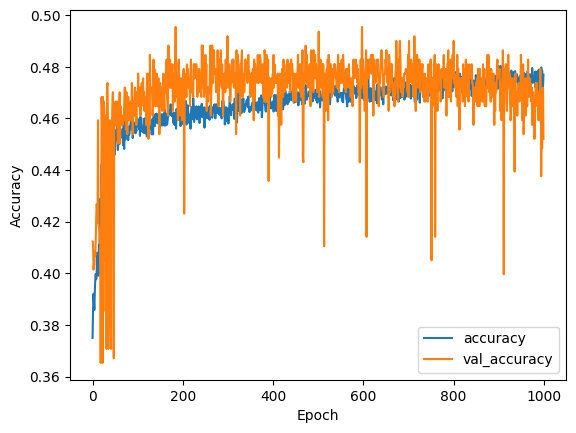

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.44862518089725034
F1 Score: 0.4322539766740873
Precision: 0.47366206590263304
Recall: 0.44862518089725034
AUC: 0.6836337979470191


## Mobile Optimization Method

###  Optimization Method - Adam

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 2s 6ms/step - loss: 1.2978 - accuracy: 0.3730 - val_loss: 1.2815 - val_accuracy: 0.3942
Epoch 2/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.2769 - accuracy: 0.3844 - val_loss: 1.2736 - val_accuracy: 0.4033
Epoch 3/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2738 - accuracy: 0.3913 - val_loss: 1.2754 - val_accuracy: 0.4033
Epoch 4/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2728 - accuracy: 0.3921 - val_loss: 1.2735 - val_accuracy: 0.3978
Epoch 5/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2708 - accuracy: 0.3925 - val_loss: 1.2684 - val_accuracy: 0.4069
Epoch 6/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2699 - accuracy: 0.3951 - val_loss: 1.2676 - val_accuracy: 0.4105
Epoch 7/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2687 - accuracy: 0.3967 - val_loss: 1.2676 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 1.1924 - accuracy: 0.4428
Test Accuracy: 0.4428364634513855


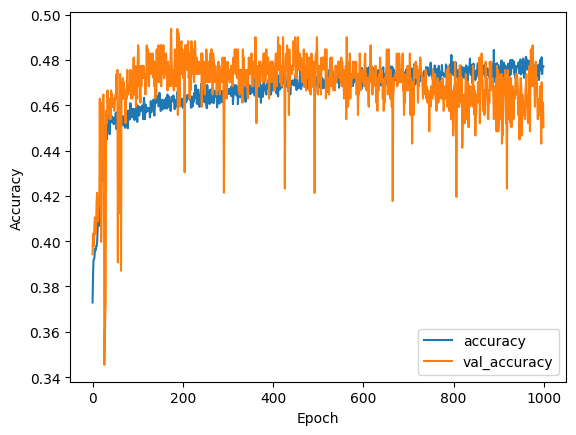

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 1ms/step
Accuracy: 0.44283646888567296
F1 Score: 0.4206208711004447
Precision: 0.48832275608371795
Recall: 0.44283646888567296
AUC: 0.6921443081473064


###  Optimization Method - SGD (Stochastic Gradient Descent)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import SGD

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer=SGD(), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 3ms/step - loss: 1.3527 - accuracy: 0.3315 - val_loss: 1.3324 - val_accuracy: 0.3309
Epoch 2/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3205 - accuracy: 0.3412 - val_loss: 1.3165 - val_accuracy: 0.3309
Epoch 3/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3080 - accuracy: 0.3456 - val_loss: 1.3077 - val_accuracy: 0.4014
Epoch 4/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3004 - accuracy: 0.3804 - val_loss: 1.3018 - val_accuracy: 0.3870
Epoch 5/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2949 - accuracy: 0.3834 - val_loss: 1.2975 - val_accuracy: 0.3942
Epoch 6/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.2909 - accuracy: 0.3836 - val_loss: 1.2932 - val_accuracy: 0.3978
Epoch 7/1000
156/156 [==============================] - 1s 3ms/step - loss: 1.2877 - accuracy: 0.3832 - val_loss: 1.2899 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 1.2642 - accuracy: 0.3929
Test Accuracy: 0.39290884137153625


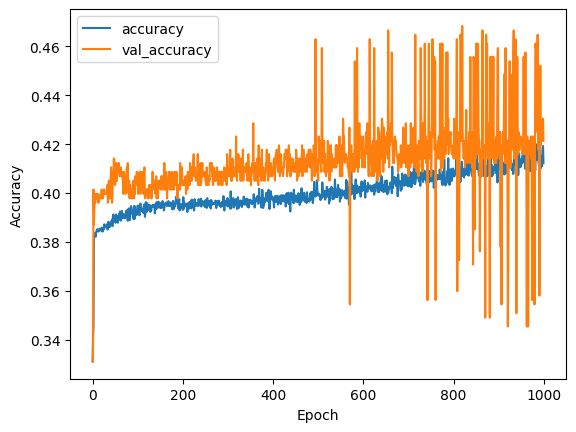

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 1ms/step
Accuracy: 0.39290882778581765
F1 Score: 0.36244438867346246
Precision: 0.3766044744937634
Recall: 0.39290882778581765
AUC: 0.6442184803100357


###  Optimization Method - RMSprop (Root Mean Squared Propagation)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import RMSprop

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer=RMSprop(), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 3ms/step - loss: 1.3008 - accuracy: 0.3764 - val_loss: 1.2807 - val_accuracy: 0.4014
Epoch 2/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2755 - accuracy: 0.3860 - val_loss: 1.2746 - val_accuracy: 0.4087
Epoch 3/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2721 - accuracy: 0.3937 - val_loss: 1.2741 - val_accuracy: 0.4014
Epoch 4/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2711 - accuracy: 0.3915 - val_loss: 1.2725 - val_accuracy: 0.4014
Epoch 5/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2710 - accuracy: 0.3915 - val_loss: 1.2688 - val_accuracy: 0.4105
Epoch 6/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2676 - accuracy: 0.4001 - val_loss: 1.2842 - val_accuracy: 0.3418
Epoch 7/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2694 - accuracy: 0.3933 - val_loss: 1.2687 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 1.1779 - accuracy: 0.4515
Test Accuracy: 0.45151954889297485


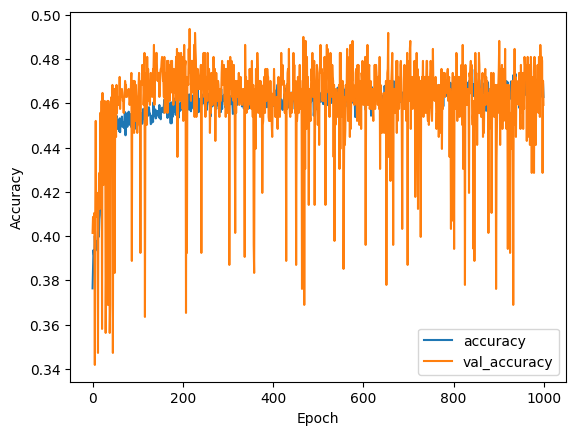

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.4515195369030391
F1 Score: 0.4168689347931498
Precision: 0.49830067836724684
Recall: 0.4515195369030391
AUC: 0.6929193553030959


## Mobile Learning Rate

###  Learning Rate 0.1

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Create custom optimizer with learning rate 0.1
custom_optimizer = RMSprop(learning_rate=0.1)

model.compile(optimizer=custom_optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 5ms/step - loss: 1.4149 - accuracy: 0.3490 - val_loss: 1.3258 - val_accuracy: 0.3562
Epoch 2/1000
156/156 [==============================] - 1s 4ms/step - loss: 1.2996 - accuracy: 0.3677 - val_loss: 1.2883 - val_accuracy: 0.3273
Epoch 3/1000
156/156 [==============================] - 1s 4ms/step - loss: 1.2981 - accuracy: 0.3687 - val_loss: 1.3081 - val_accuracy: 0.3418
Epoch 4/1000
156/156 [==============================] - 1s 3ms/step - loss: 1.2955 - accuracy: 0.3701 - val_loss: 1.3030 - val_accuracy: 0.3436
Epoch 5/1000
156/156 [==============================] - 1s 4ms/step - loss: 1.2986 - accuracy: 0.3625 - val_loss: 1.2942 - val_accuracy: 0.3309
Epoch 6/1000
156/156 [==============================] - 1s 3ms/step - loss: 1.2949 - accuracy: 0.3623 - val_loss: 1.3067 - val_accuracy: 0.3689
Epoch 7/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2971 - accuracy: 0.3603 - val_loss: 1.2978 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 1.3561 - accuracy: 0.2822
Test Accuracy: 0.2821997106075287


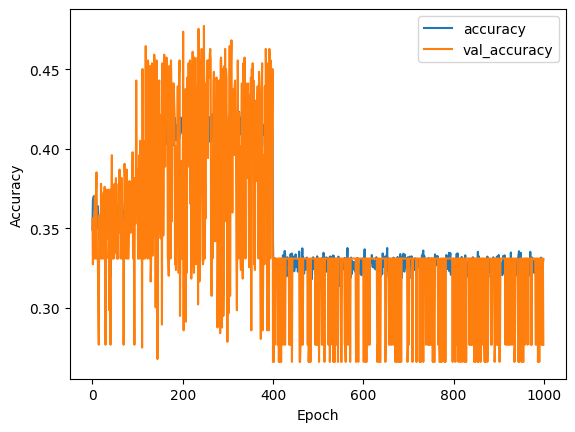

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.2821997105643994
F1 Score: 0.12421883422134962
Precision: 0.0796366766426308
Recall: 0.2821997105643994
AUC: 0.49980559360610466


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


###  Learning Rate 0.01

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Create custom optimizer with learning rate 0.01
custom_optimizer = RMSprop(learning_rate=0.01)

model.compile(optimizer=custom_optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 4ms/step - loss: 1.2900 - accuracy: 0.3691 - val_loss: 1.3663 - val_accuracy: 0.3309
Epoch 2/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.2829 - accuracy: 0.3818 - val_loss: 1.2802 - val_accuracy: 0.3472
Epoch 3/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.2763 - accuracy: 0.3858 - val_loss: 1.2839 - val_accuracy: 0.3996
Epoch 4/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2752 - accuracy: 0.3868 - val_loss: 1.2769 - val_accuracy: 0.3960
Epoch 5/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.2737 - accuracy: 0.3893 - val_loss: 1.2693 - val_accuracy: 0.4123
Epoch 6/1000
156/156 [==============================] - 1s 4ms/step - loss: 1.2696 - accuracy: 0.3951 - val_loss: 1.2710 - val_accuracy: 0.4177
Epoch 7/1000
156/156 [==============================] - 1s 4ms/step - loss: 1.2653 - accuracy: 0.4058 - val_loss: 1.3269 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 1.2111 - accuracy: 0.4443
Test Accuracy: 0.4442836344242096


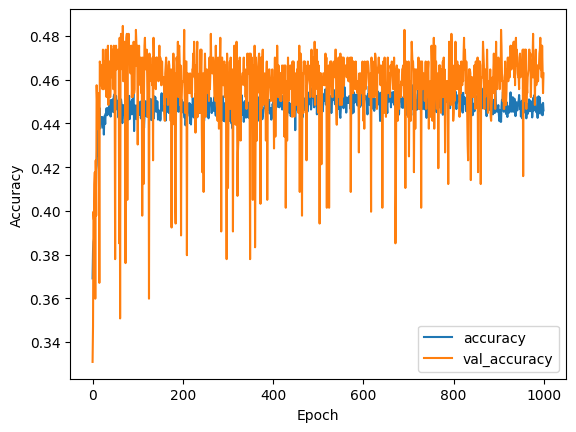

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.4442836468885673
F1 Score: 0.38848985222072485
Precision: 0.4582855157826871
Recall: 0.4442836468885673
AUC: 0.6654869364572307


###  Learning Rate 0.001

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Create custom optimizer with learning rate 0.001
custom_optimizer = RMSprop(learning_rate=0.001)

model.compile(optimizer=custom_optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 3ms/step - loss: 1.2979 - accuracy: 0.3790 - val_loss: 1.2831 - val_accuracy: 0.3996
Epoch 2/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2763 - accuracy: 0.3866 - val_loss: 1.2747 - val_accuracy: 0.3978
Epoch 3/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2743 - accuracy: 0.3858 - val_loss: 1.2732 - val_accuracy: 0.3960
Epoch 4/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.2717 - accuracy: 0.3927 - val_loss: 1.2749 - val_accuracy: 0.3942
Epoch 5/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.2716 - accuracy: 0.3925 - val_loss: 1.2710 - val_accuracy: 0.4051
Epoch 6/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2699 - accuracy: 0.3945 - val_loss: 1.2739 - val_accuracy: 0.4069
Epoch 7/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.2690 - accuracy: 0.3979 - val_loss: 1.2753 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 1.1763 - accuracy: 0.4595
Test Accuracy: 0.4594790041446686


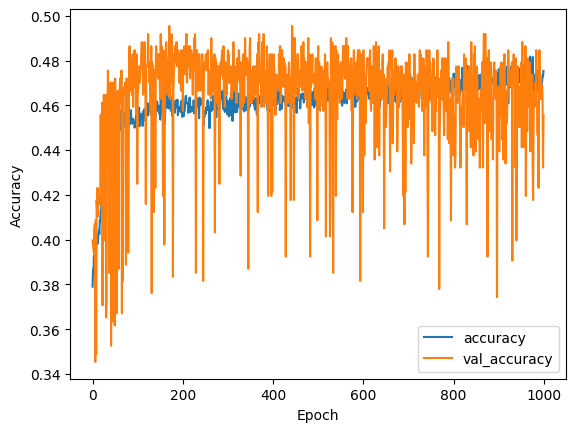

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.459479015918958
F1 Score: 0.4436004719292378
Precision: 0.5273898519227055
Recall: 0.459479015918958
AUC: 0.693260813116042


###  Learning Rate 0.0001

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Create custom optimizer with learning rate 0.0001
custom_optimizer = RMSprop(learning_rate=0.0001)

model.compile(optimizer=custom_optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 4ms/step - loss: 1.3538 - accuracy: 0.3122 - val_loss: 1.3361 - val_accuracy: 0.2948
Epoch 2/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.3215 - accuracy: 0.3661 - val_loss: 1.3156 - val_accuracy: 0.3996
Epoch 3/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3057 - accuracy: 0.3816 - val_loss: 1.3041 - val_accuracy: 0.3996
Epoch 4/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2961 - accuracy: 0.3864 - val_loss: 1.2965 - val_accuracy: 0.3978
Epoch 5/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.2892 - accuracy: 0.3866 - val_loss: 1.2910 - val_accuracy: 0.3960
Epoch 6/1000
156/156 [==============================] - 1s 3ms/step - loss: 1.2845 - accuracy: 0.3844 - val_loss: 1.2873 - val_accuracy: 0.3996
Epoch 7/1000
156/156 [==============================] - 1s 3ms/step - loss: 1.2814 - accuracy: 0.3864 - val_loss: 1.2841 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 1.1864 - accuracy: 0.4522
Test Accuracy: 0.4522431194782257


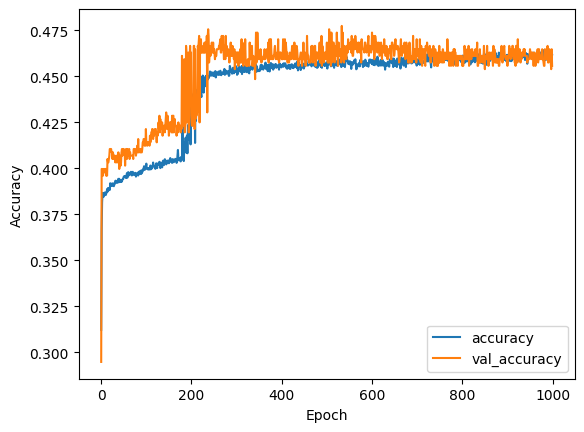

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.45224312590448623
F1 Score: 0.42158733848451857
Precision: 0.4648560400569266
Recall: 0.45224312590448623
AUC: 0.6781078986405086


###  Learning Rate 0.00001

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Create custom optimizer with learning rate 0.00001
custom_optimizer = RMSprop(learning_rate=0.00001)

model.compile(optimizer=custom_optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 4ms/step - loss: 1.3884 - accuracy: 0.2772 - val_loss: 1.3842 - val_accuracy: 0.2857
Epoch 2/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3806 - accuracy: 0.3132 - val_loss: 1.3766 - val_accuracy: 0.3400
Epoch 3/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3733 - accuracy: 0.3547 - val_loss: 1.3699 - val_accuracy: 0.3472
Epoch 4/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3667 - accuracy: 0.3631 - val_loss: 1.3637 - val_accuracy: 0.3599
Epoch 5/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3604 - accuracy: 0.3800 - val_loss: 1.3577 - val_accuracy: 0.3870
Epoch 6/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3546 - accuracy: 0.3872 - val_loss: 1.3523 - val_accuracy: 0.3960
Epoch 7/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3492 - accuracy: 0.3858 - val_loss: 1.3472 - val_accuracy:

44/44 [==============================] - 0s 3ms/step - loss: 1.2654 - accuracy: 0.3849
Test Accuracy: 0.38494935631752014


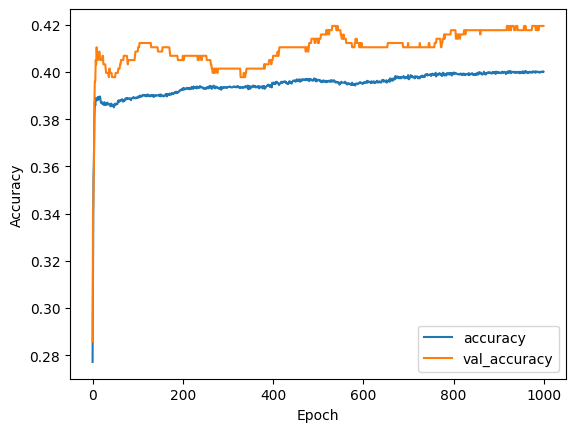

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 1ms/step
Accuracy: 0.3849493487698987
F1 Score: 0.33845500138782425
Precision: 0.35341419224381565
Recall: 0.3849493487698987
AUC: 0.639231277344801


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Inception Segmentation Model

### 25 Epochs

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=25, batch_size=32, validation_split=0.1)

Epoch 1/25
156/156 [==============================] - 2s 4ms/step - loss: 1.3066 - accuracy: 0.3677 - val_loss: 1.3102 - val_accuracy: 0.3671
Epoch 2/25
156/156 [==============================] - 1s 3ms/step - loss: 1.2933 - accuracy: 0.3752 - val_loss: 1.3089 - val_accuracy: 0.3671
Epoch 3/25
156/156 [==============================] - 1s 3ms/step - loss: 1.2926 - accuracy: 0.3800 - val_loss: 1.3078 - val_accuracy: 0.3635
Epoch 4/25
156/156 [==============================] - 0s 3ms/step - loss: 1.2924 - accuracy: 0.3760 - val_loss: 1.3158 - val_accuracy: 0.3599
Epoch 5/25
156/156 [==============================] - 1s 3ms/step - loss: 1.2935 - accuracy: 0.3776 - val_loss: 1.3087 - val_accuracy: 0.3671
Epoch 6/25
156/156 [==============================] - 1s 3ms/step - loss: 1.2920 - accuracy: 0.3820 - val_loss: 1.3087 - val_accuracy: 0.3599
Epoch 7/25
156/156 [==============================] - 1s 4ms/step - loss: 1.2914 - accuracy: 0.3788 - val_loss: 1.3054 - val_accuracy: 0.3635
Epoch 

44/44 [==============================] - 0s 2ms/step - loss: 1.2900 - accuracy: 0.3683
Test Accuracy: 0.36830681562423706


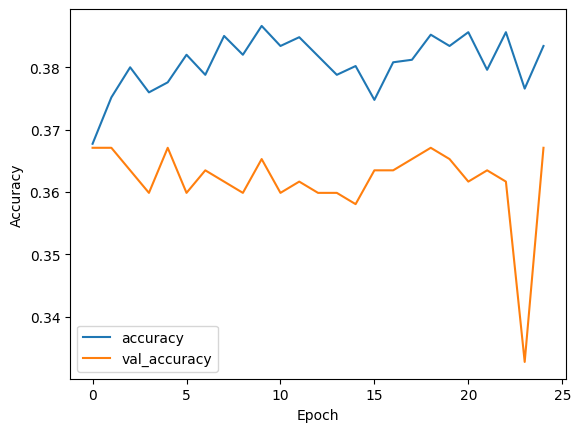

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 1ms/step
Accuracy: 0.3683068017366136
F1 Score: 0.28309186981324647
Precision: 0.2614545006368451
Recall: 0.3683068017366136
AUC: 0.6020265934368892


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### 50 epochs

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.1)

Epoch 1/50
156/156 [==============================] - 2s 4ms/step - loss: 1.3057 - accuracy: 0.3766 - val_loss: 1.3152 - val_accuracy: 0.3562
Epoch 2/50
156/156 [==============================] - 1s 3ms/step - loss: 1.2937 - accuracy: 0.3780 - val_loss: 1.3107 - val_accuracy: 0.3562
Epoch 3/50
156/156 [==============================] - 1s 3ms/step - loss: 1.2935 - accuracy: 0.3776 - val_loss: 1.3104 - val_accuracy: 0.3617
Epoch 4/50
156/156 [==============================] - 1s 3ms/step - loss: 1.2930 - accuracy: 0.3830 - val_loss: 1.3082 - val_accuracy: 0.3617
Epoch 5/50
156/156 [==============================] - 1s 3ms/step - loss: 1.2914 - accuracy: 0.3812 - val_loss: 1.3084 - val_accuracy: 0.3599
Epoch 6/50
156/156 [==============================] - 1s 3ms/step - loss: 1.2928 - accuracy: 0.3868 - val_loss: 1.3075 - val_accuracy: 0.3599
Epoch 7/50
156/156 [==============================] - 1s 3ms/step - loss: 1.2924 - accuracy: 0.3770 - val_loss: 1.3060 - val_accuracy: 0.3617
Epoch 

44/44 [==============================] - 0s 2ms/step - loss: 1.2886 - accuracy: 0.3705
Test Accuracy: 0.370477557182312


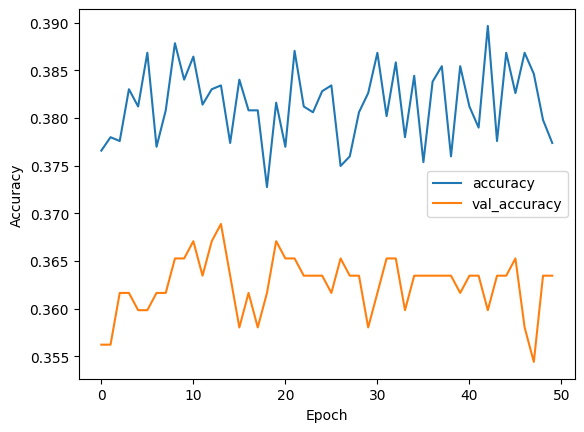

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.3704775687409551
F1 Score: 0.28176362382402637
Precision: 0.24010708222280566
Recall: 0.3704775687409551
AUC: 0.6059578215841743


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### 100 epochs

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.1)

Epoch 1/100
156/156 [==============================] - 2s 4ms/step - loss: 1.3023 - accuracy: 0.3705 - val_loss: 1.3132 - val_accuracy: 0.3599
Epoch 2/100
156/156 [==============================] - 1s 3ms/step - loss: 1.2942 - accuracy: 0.3834 - val_loss: 1.3099 - val_accuracy: 0.3562
Epoch 3/100
156/156 [==============================] - 1s 3ms/step - loss: 1.2939 - accuracy: 0.3748 - val_loss: 1.3076 - val_accuracy: 0.3617
Epoch 4/100
156/156 [==============================] - 1s 3ms/step - loss: 1.2926 - accuracy: 0.3818 - val_loss: 1.3101 - val_accuracy: 0.3562
Epoch 5/100
156/156 [==============================] - 1s 4ms/step - loss: 1.2921 - accuracy: 0.3850 - val_loss: 1.3114 - val_accuracy: 0.3617
Epoch 6/100
156/156 [==============================] - 1s 3ms/step - loss: 1.2919 - accuracy: 0.3776 - val_loss: 1.3129 - val_accuracy: 0.3562
Epoch 7/100
156/156 [==============================] - 1s 3ms/step - loss: 1.2924 - accuracy: 0.3836 - val_loss: 1.3104 - val_accuracy: 0.3653

44/44 [==============================] - 0s 2ms/step - loss: 1.2919 - accuracy: 0.3683
Test Accuracy: 0.36830681562423706


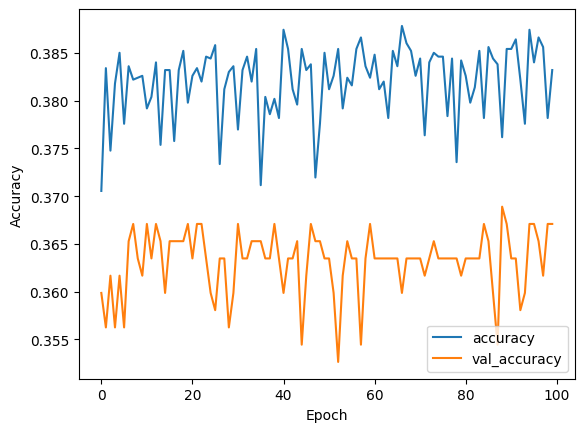

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.3683068017366136
F1 Score: 0.2886494796621305
Precision: 0.31733423336247363
Recall: 0.3683068017366136
AUC: 0.6061770021157797


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### 200 Epoach

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=200, batch_size=32, validation_split=0.1)

Epoch 1/200
156/156 [==============================] - 2s 6ms/step - loss: 1.3135 - accuracy: 0.3579 - val_loss: 1.3137 - val_accuracy: 0.3562
Epoch 2/200
156/156 [==============================] - 1s 6ms/step - loss: 1.2940 - accuracy: 0.3786 - val_loss: 1.3098 - val_accuracy: 0.3562
Epoch 3/200
156/156 [==============================] - 1s 5ms/step - loss: 1.2931 - accuracy: 0.3730 - val_loss: 1.3109 - val_accuracy: 0.3562
Epoch 4/200
156/156 [==============================] - 1s 5ms/step - loss: 1.2920 - accuracy: 0.3820 - val_loss: 1.3108 - val_accuracy: 0.3617
Epoch 5/200
156/156 [==============================] - 1s 5ms/step - loss: 1.2931 - accuracy: 0.3834 - val_loss: 1.3084 - val_accuracy: 0.3580
Epoch 6/200
156/156 [==============================] - 1s 5ms/step - loss: 1.2926 - accuracy: 0.3802 - val_loss: 1.3106 - val_accuracy: 0.3617
Epoch 7/200
156/156 [==============================] - 1s 3ms/step - loss: 1.2920 - accuracy: 0.3758 - val_loss: 1.3080 - val_accuracy: 0.3617

44/44 [==============================] - 0s 2ms/step - loss: 1.2977 - accuracy: 0.3683
Test Accuracy: 0.36830681562423706


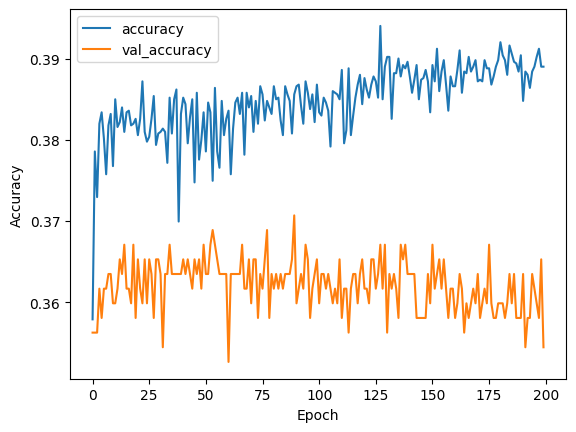

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.3683068017366136
F1 Score: 0.3037736998837124
Precision: 0.3361300065661856
Recall: 0.3683068017366136
AUC: 0.5998193985838972


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### 300 Epoch

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=300, batch_size=32, validation_split=0.1)

Epoch 1/300
156/156 [==============================] - 2s 5ms/step - loss: 1.3101 - accuracy: 0.3649 - val_loss: 1.3102 - val_accuracy: 0.3635
Epoch 2/300
156/156 [==============================] - 1s 5ms/step - loss: 1.2931 - accuracy: 0.3782 - val_loss: 1.3093 - val_accuracy: 0.3599
Epoch 3/300
156/156 [==============================] - 1s 6ms/step - loss: 1.2926 - accuracy: 0.3806 - val_loss: 1.3095 - val_accuracy: 0.3635
Epoch 4/300
156/156 [==============================] - 1s 5ms/step - loss: 1.2926 - accuracy: 0.3840 - val_loss: 1.3091 - val_accuracy: 0.3544
Epoch 5/300
156/156 [==============================] - 1s 6ms/step - loss: 1.2916 - accuracy: 0.3834 - val_loss: 1.3087 - val_accuracy: 0.3635
Epoch 6/300
156/156 [==============================] - 1s 5ms/step - loss: 1.2912 - accuracy: 0.3822 - val_loss: 1.3067 - val_accuracy: 0.3599
Epoch 7/300
156/156 [==============================] - 1s 5ms/step - loss: 1.2909 - accuracy: 0.3872 - val_loss: 1.3097 - val_accuracy: 0.3599

44/44 [==============================] - 0s 2ms/step - loss: 1.3023 - accuracy: 0.3661
Test Accuracy: 0.3661360442638397


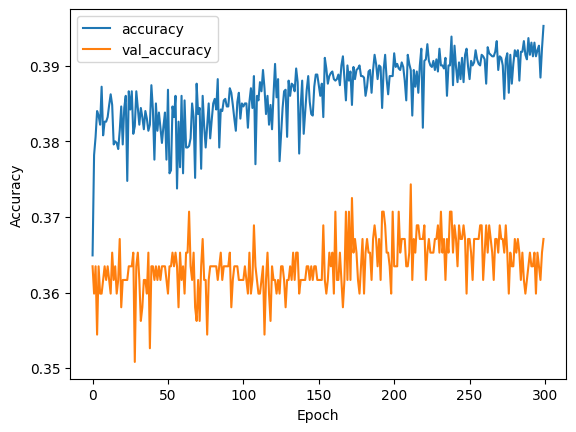

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.3661360347322721
F1 Score: 0.3073322039351811
Precision: 0.3324064063953202
Recall: 0.3661360347322721
AUC: 0.5917795088532142


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### 500 epochs

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=500, batch_size=32, validation_split=0.1)

Epoch 1/500
156/156 [==============================] - 2s 4ms/step - loss: 1.3156 - accuracy: 0.3649 - val_loss: 1.3100 - val_accuracy: 0.3671
Epoch 2/500
156/156 [==============================] - 1s 4ms/step - loss: 1.2930 - accuracy: 0.3844 - val_loss: 1.3107 - val_accuracy: 0.3599
Epoch 3/500
156/156 [==============================] - 1s 3ms/step - loss: 1.2931 - accuracy: 0.3754 - val_loss: 1.3091 - val_accuracy: 0.3580
Epoch 4/500
156/156 [==============================] - 1s 3ms/step - loss: 1.2926 - accuracy: 0.3848 - val_loss: 1.3086 - val_accuracy: 0.3599
Epoch 5/500
156/156 [==============================] - 1s 3ms/step - loss: 1.2919 - accuracy: 0.3780 - val_loss: 1.3106 - val_accuracy: 0.3599
Epoch 6/500
156/156 [==============================] - 1s 3ms/step - loss: 1.2923 - accuracy: 0.3758 - val_loss: 1.3075 - val_accuracy: 0.3635
Epoch 7/500
156/156 [==============================] - 1s 3ms/step - loss: 1.2925 - accuracy: 0.3710 - val_loss: 1.3074 - val_accuracy: 0.3599

44/44 [==============================] - 0s 2ms/step - loss: 1.3162 - accuracy: 0.3669
Test Accuracy: 0.3668596148490906


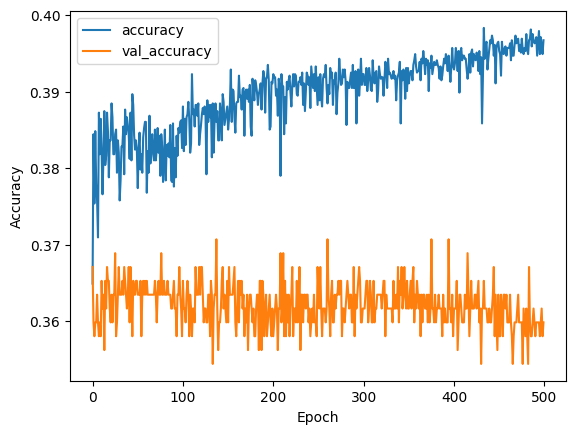

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 1ms/step
Accuracy: 0.3668596237337192
F1 Score: 0.3101685295466808
Precision: 0.336880292143651
Recall: 0.3668596237337192
AUC: 0.5938795531865396


### 1000 Epochs

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 2s 4ms/step - loss: 1.3015 - accuracy: 0.3730 - val_loss: 1.3082 - val_accuracy: 0.3599
Epoch 2/1000
156/156 [==============================] - 1s 3ms/step - loss: 1.2932 - accuracy: 0.3842 - val_loss: 1.3098 - val_accuracy: 0.3635
Epoch 3/1000
156/156 [==============================] - 1s 4ms/step - loss: 1.2920 - accuracy: 0.3858 - val_loss: 1.3090 - val_accuracy: 0.3562
Epoch 4/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.2934 - accuracy: 0.3744 - val_loss: 1.3090 - val_accuracy: 0.3580
Epoch 5/1000
156/156 [==============================] - 1s 3ms/step - loss: 1.2917 - accuracy: 0.3822 - val_loss: 1.3093 - val_accuracy: 0.3617
Epoch 6/1000
156/156 [==============================] - 1s 3ms/step - loss: 1.2925 - accuracy: 0.3756 - val_loss: 1.3089 - val_accuracy: 0.3599
Epoch 7/1000
156/156 [==============================] - 1s 3ms/step - loss: 1.2916 - accuracy: 0.3796 - val_loss: 1.3088 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 1.3625 - accuracy: 0.3915
Test Accuracy: 0.39146164059638977


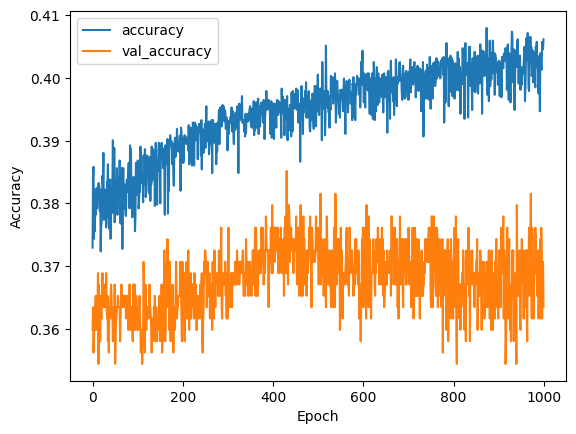

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.3914616497829233
F1 Score: 0.3330339934867627
Precision: 0.34120667080146094
Recall: 0.3914616497829233
AUC: 0.5913375453992133


## Inception Optimization Method

###  Optimization Method - Adam

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 4ms/step - loss: 1.3053 - accuracy: 0.3744 - val_loss: 1.3165 - val_accuracy: 0.3617
Epoch 2/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2934 - accuracy: 0.3768 - val_loss: 1.3113 - val_accuracy: 0.3599
Epoch 3/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2927 - accuracy: 0.3782 - val_loss: 1.3094 - val_accuracy: 0.3562
Epoch 4/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.2925 - accuracy: 0.3820 - val_loss: 1.3079 - val_accuracy: 0.3689
Epoch 5/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2922 - accuracy: 0.3844 - val_loss: 1.3078 - val_accuracy: 0.3580
Epoch 6/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.2920 - accuracy: 0.3808 - val_loss: 1.3132 - val_accuracy: 0.3653
Epoch 7/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2923 - accuracy: 0.3820 - val_loss: 1.3087 - val_accuracy:

44/44 [==============================] - 0s 3ms/step - loss: 1.3461 - accuracy: 0.3611
Test Accuracy: 0.3610709011554718


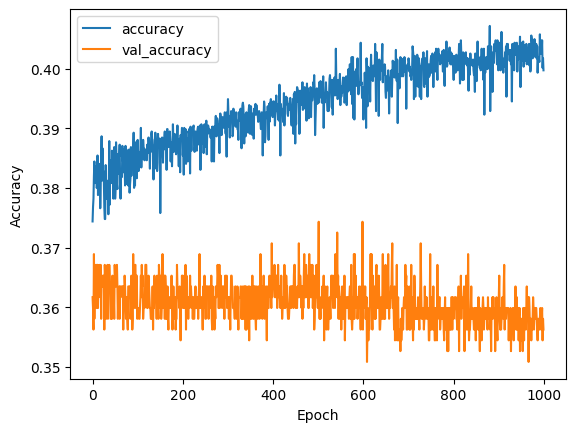

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.36107091172214184
F1 Score: 0.30272719775486345
Precision: 0.3247918457984588
Recall: 0.36107091172214184
AUC: 0.589862625265123


###  Optimization Method - SGD (Stochastic Gradient Descent)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import SGD

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer=SGD(), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 3ms/step - loss: 1.3545 - accuracy: 0.3569 - val_loss: 1.3336 - val_accuracy: 0.3562
Epoch 2/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3164 - accuracy: 0.3681 - val_loss: 1.3182 - val_accuracy: 0.3617
Epoch 3/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3027 - accuracy: 0.3778 - val_loss: 1.3127 - val_accuracy: 0.3580
Epoch 4/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2963 - accuracy: 0.3830 - val_loss: 1.3108 - val_accuracy: 0.3617
Epoch 5/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2933 - accuracy: 0.3848 - val_loss: 1.3103 - val_accuracy: 0.3617
Epoch 6/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2921 - accuracy: 0.3842 - val_loss: 1.3104 - val_accuracy: 0.3599
Epoch 7/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2917 - accuracy: 0.3804 - val_loss: 1.3105 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 1.2892 - accuracy: 0.3683
Test Accuracy: 0.36830681562423706


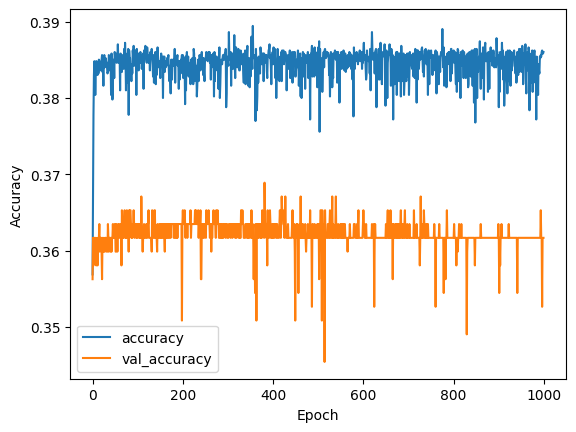

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.3683068017366136
F1 Score: 0.284118759300506
Precision: 0.2759744180523025
Recall: 0.3683068017366136
AUC: 0.6004284995621572


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


###  Optimization Method - RMSprop (Root Mean Squared Propagation)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import RMSprop

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer=RMSprop(), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 4ms/step - loss: 1.3174 - accuracy: 0.3593 - val_loss: 1.3174 - val_accuracy: 0.3599
Epoch 2/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2928 - accuracy: 0.3876 - val_loss: 1.3127 - val_accuracy: 0.3580
Epoch 3/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2926 - accuracy: 0.3818 - val_loss: 1.3097 - val_accuracy: 0.3599
Epoch 4/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2918 - accuracy: 0.3824 - val_loss: 1.3080 - val_accuracy: 0.3635
Epoch 5/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2923 - accuracy: 0.3842 - val_loss: 1.3075 - val_accuracy: 0.3635
Epoch 6/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2921 - accuracy: 0.3754 - val_loss: 1.3130 - val_accuracy: 0.3617
Epoch 7/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2908 - accuracy: 0.3818 - val_loss: 1.3092 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 1.3102 - accuracy: 0.3654
Test Accuracy: 0.3654124438762665


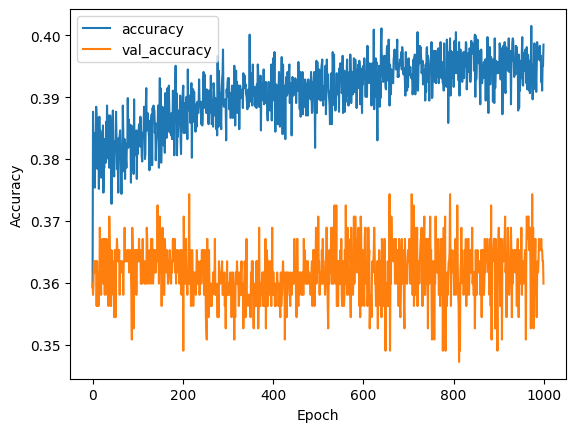

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.3654124457308249
F1 Score: 0.32255813150822554
Precision: 0.3526869638549936
Recall: 0.3654124457308249
AUC: 0.5957044643177848


## Inception Learning Rate

###  Learning Rate 0.1

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Create custom optimizer with learning rate 0.1
custom_optimizer = SGD(learning_rate=0.1)

model.compile(optimizer=custom_optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 3ms/step - loss: 1.3073 - accuracy: 0.3750 - val_loss: 1.3131 - val_accuracy: 0.3562
Epoch 2/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2943 - accuracy: 0.3836 - val_loss: 1.3110 - val_accuracy: 0.3599
Epoch 3/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2927 - accuracy: 0.3947 - val_loss: 1.3086 - val_accuracy: 0.3599
Epoch 4/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2925 - accuracy: 0.3854 - val_loss: 1.3149 - val_accuracy: 0.3599
Epoch 5/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2929 - accuracy: 0.3802 - val_loss: 1.3087 - val_accuracy: 0.3599
Epoch 6/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2926 - accuracy: 0.3846 - val_loss: 1.3170 - val_accuracy: 0.3635
Epoch 7/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.2932 - accuracy: 0.3844 - val_loss: 1.3083 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 1.2951 - accuracy: 0.3683
Test Accuracy: 0.36830681562423706


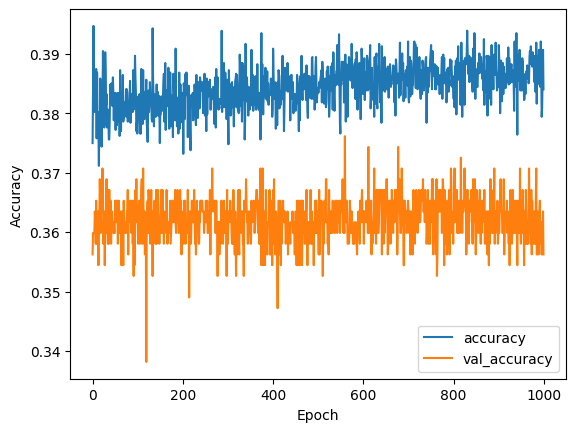

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 1ms/step
Accuracy: 0.3683068017366136
F1 Score: 0.30499935092521396
Precision: 0.3405389402321591
Recall: 0.3683068017366136
AUC: 0.5977208205007938


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


###  Learning Rate 0.01

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Create custom optimizer with learning rate 0.01
custom_optimizer = SGD(learning_rate=0.01)

model.compile(optimizer=custom_optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 3ms/step - loss: 1.3370 - accuracy: 0.3472 - val_loss: 1.3260 - val_accuracy: 0.3309
Epoch 2/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3083 - accuracy: 0.3714 - val_loss: 1.3154 - val_accuracy: 0.3490
Epoch 3/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2991 - accuracy: 0.3798 - val_loss: 1.3127 - val_accuracy: 0.3508
Epoch 4/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2956 - accuracy: 0.3796 - val_loss: 1.3122 - val_accuracy: 0.3526
Epoch 5/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2940 - accuracy: 0.3760 - val_loss: 1.3119 - val_accuracy: 0.3526
Epoch 6/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2932 - accuracy: 0.3810 - val_loss: 1.3118 - val_accuracy: 0.3544
Epoch 7/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.2929 - accuracy: 0.3816 - val_loss: 1.3119 - val_accuracy:

44/44 [==============================] - 0s 3ms/step - loss: 1.2893 - accuracy: 0.3683
Test Accuracy: 0.36830681562423706


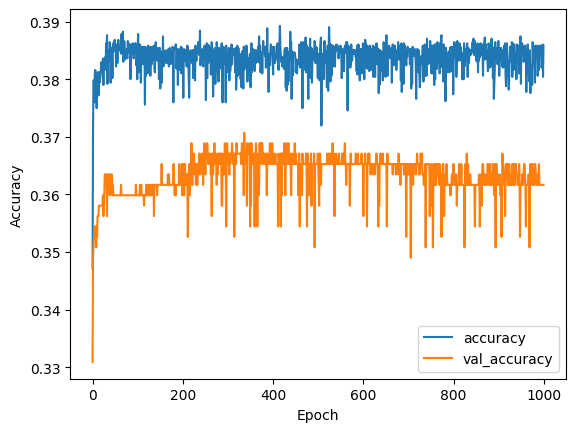

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.3683068017366136
F1 Score: 0.28394861856496395
Precision: 0.27801218305958286
Recall: 0.3683068017366136
AUC: 0.5981501867662402


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


###  Learning Rate 0.001

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Create custom optimizer with learning rate 0.001
custom_optimizer = SGD(learning_rate=0.001)

model.compile(optimizer=custom_optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 5ms/step - loss: 1.3782 - accuracy: 0.2663 - val_loss: 1.3720 - val_accuracy: 0.2821
Epoch 2/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.3663 - accuracy: 0.3317 - val_loss: 1.3629 - val_accuracy: 0.3490
Epoch 3/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3570 - accuracy: 0.3659 - val_loss: 1.3553 - val_accuracy: 0.3544
Epoch 4/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3491 - accuracy: 0.3677 - val_loss: 1.3490 - val_accuracy: 0.3544
Epoch 5/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3423 - accuracy: 0.3722 - val_loss: 1.3435 - val_accuracy: 0.3562
Epoch 6/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3364 - accuracy: 0.3772 - val_loss: 1.3388 - val_accuracy: 0.3544
Epoch 7/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3313 - accuracy: 0.3780 - val_loss: 1.3348 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 1.2915 - accuracy: 0.3690
Test Accuracy: 0.3690303862094879


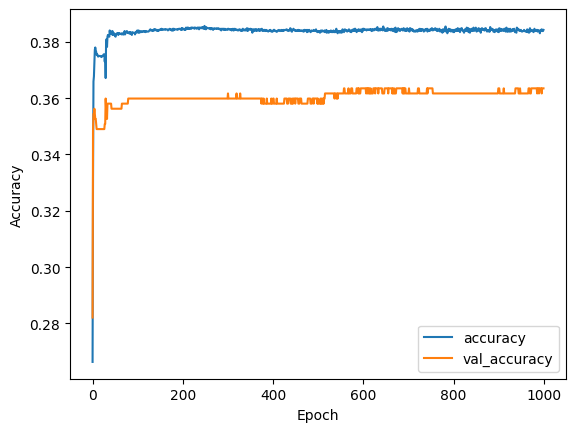

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.36903039073806077
F1 Score: 0.28803423828863184
Precision: 0.3159023430023189
Recall: 0.36903039073806077
AUC: 0.5956122890419729


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


###  Learning Rate 0.0001

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Create custom optimizer with learning rate 0.0001
custom_optimizer = SGD(learning_rate=0.0001)

model.compile(optimizer=custom_optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 3ms/step - loss: 1.3961 - accuracy: 0.1436 - val_loss: 1.3923 - val_accuracy: 0.1736
Epoch 2/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3948 - accuracy: 0.1481 - val_loss: 1.3912 - val_accuracy: 0.1772
Epoch 3/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3935 - accuracy: 0.1507 - val_loss: 1.3900 - val_accuracy: 0.1790
Epoch 4/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3922 - accuracy: 0.1521 - val_loss: 1.3888 - val_accuracy: 0.1808
Epoch 5/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.3909 - accuracy: 0.1527 - val_loss: 1.3877 - val_accuracy: 0.1736
Epoch 6/1000
156/156 [==============================] - 1s 3ms/step - loss: 1.3896 - accuracy: 0.1541 - val_loss: 1.3866 - val_accuracy: 0.1718
Epoch 7/1000
156/156 [==============================] - 1s 3ms/step - loss: 1.3884 - accuracy: 0.1545 - val_loss: 1.3855 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 1.2939 - accuracy: 0.3647
Test Accuracy: 0.36468884348869324


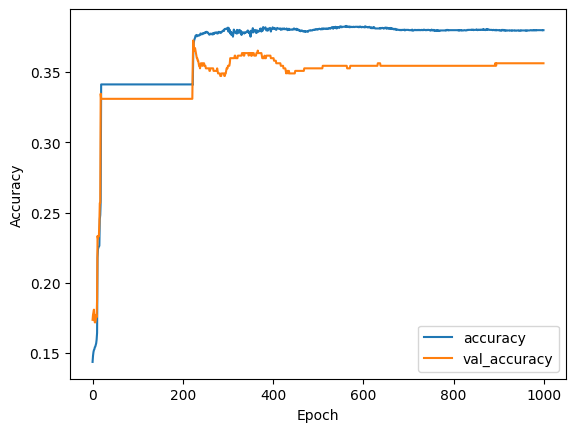

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.36468885672937773
F1 Score: 0.2872618444705678
Precision: 0.3076152609667355
Recall: 0.36468885672937773
AUC: 0.5768228749064608


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


###  Learning Rate 0.00001

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Create custom optimizer with learning rate 0.00001
custom_optimizer = Adam(learning_rate=0.00001)

model.compile(optimizer=custom_optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

Epoch 1/1000
156/156 [==============================] - 1s 4ms/step - loss: 1.3873 - accuracy: 0.2659 - val_loss: 1.3832 - val_accuracy: 0.2803
Epoch 2/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.3808 - accuracy: 0.2684 - val_loss: 1.3777 - val_accuracy: 0.2586
Epoch 3/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.3750 - accuracy: 0.2394 - val_loss: 1.3728 - val_accuracy: 0.2586
Epoch 4/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3696 - accuracy: 0.2404 - val_loss: 1.3683 - val_accuracy: 0.2586
Epoch 5/1000
156/156 [==============================] - 0s 3ms/step - loss: 1.3646 - accuracy: 0.2426 - val_loss: 1.3640 - val_accuracy: 0.2586
Epoch 6/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3598 - accuracy: 0.2452 - val_loss: 1.3600 - val_accuracy: 0.2550
Epoch 7/1000
156/156 [==============================] - 0s 2ms/step - loss: 1.3552 - accuracy: 0.2983 - val_loss: 1.3559 - val_accuracy:

44/44 [==============================] - 0s 2ms/step - loss: 1.2906 - accuracy: 0.3698
Test Accuracy: 0.36975398659706116


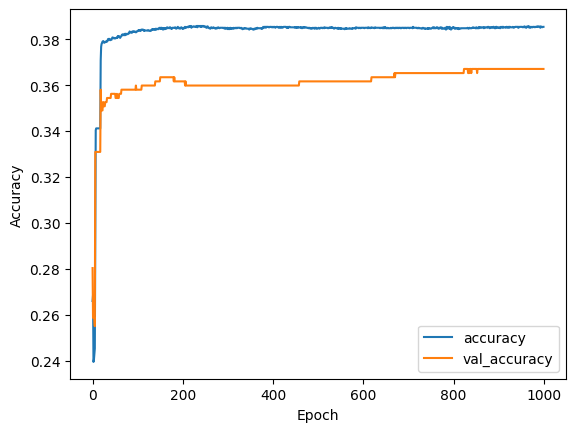

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix

y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

conf_matrix = confusion_matrix(y_test, y_pred)

auc = roc_auc_score(to_categorical(y_test), y_pred_probs, multi_class='ovr')

print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("AUC:", auc)

44/44 [==============================] - 0s 2ms/step
Accuracy: 0.36975397973950797
F1 Score: 0.28232840750930477
Precision: 0.24201291653353882
Recall: 0.36975397973950797
AUC: 0.6034249365953958


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Feature Classification ML Techniques

## CNN Feature

### SVM

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])  # Updated dependent variable name

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

svm_model = SVC(kernel='linear', C=1, gamma='auto', decision_function_shape='ovr')

svm_model.fit(X_train, y_train)

y_pred = svm_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.9544138929088278

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95       390
           1       0.91      0.98      0.94       341
           2       0.98      0.96      0.97       473
           3       0.99      0.88      0.93       178

    accuracy                           0.95      1382
   macro avg       0.96      0.94      0.95      1382
weighted avg       0.96      0.95      0.95      1382



### Logistic Regression

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

logistic_model = LogisticRegression(max_iter=1000)

logistic_model.fit(X_train, y_train)

y_pred = logistic_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# AUC calculation for Logistic Regression
auc = roc_auc_score(y_test, logistic_model.predict_proba(X_test), multi_class='ovr')
print("\nAUC:", auc)

Accuracy: 0.9544138929088278

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95       390
           1       0.91      0.98      0.94       341
           2       0.98      0.96      0.97       473
           3       0.99      0.88      0.93       178

    accuracy                           0.95      1382
   macro avg       0.96      0.94      0.95      1382
weighted avg       0.96      0.95      0.95      1382


AUC: 0.9747241430789888


### Naive Bayes

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

nb_model = GaussianNB()

nb_model.fit(X_train, y_train)

y_pred = nb_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# AUC calculation for Naive Bayes
auc = roc_auc_score(y_test, nb_model.predict_proba(X_test), multi_class='ovr')
print("\nAUC:", auc)

Accuracy: 0.9544138929088278

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95       390
           1       0.92      0.98      0.95       341
           2       0.98      0.96      0.97       473
           3       0.98      0.88      0.93       178

    accuracy                           0.95      1382
   macro avg       0.96      0.94      0.95      1382
weighted avg       0.96      0.95      0.95      1382


AUC: 0.9710432546791656


### KNN

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

knn_model = KNeighborsClassifier(n_neighbors=5)

knn_model.fit(X_train, y_train)

y_pred = knn_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.9573082489146165

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95       390
           1       0.92      0.98      0.95       341
           2       1.00      0.97      0.98       473
           3       0.98      0.89      0.93       178

    accuracy                           0.96      1382
   macro avg       0.96      0.95      0.95      1382
weighted avg       0.96      0.96      0.96      1382



### Decision Tree

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

dt_model = DecisionTreeClassifier()

dt_model.fit(X_train, y_train)

y_pred = dt_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# AUC calculation for Decision Tree
auc = roc_auc_score(y_test, dt_model.predict_proba(X_test), multi_class='ovr')
print("\nAUC:", auc)

Accuracy: 0.9580318379160637

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95       390
           1       0.92      0.98      0.95       341
           2       0.98      0.97      0.98       473
           3       0.99      0.88      0.93       178

    accuracy                           0.96      1382
   macro avg       0.96      0.95      0.95      1382
weighted avg       0.96      0.96      0.96      1382


AUC: 0.9745268455408518


### Random Forest

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestClassifier()

rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# AUC calculation for Random Forest
auc = roc_auc_score(y_test, rf_model.predict_proba(X_test), multi_class='ovr')
print("\nAUC:", auc)


Accuracy: 0.9580318379160637

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95       390
           1       0.92      0.98      0.95       341
           2       0.98      0.97      0.98       473
           3       0.99      0.88      0.93       178

    accuracy                           0.96      1382
   macro avg       0.96      0.95      0.95      1382
weighted avg       0.96      0.96      0.96      1382


AUC: 0.9743454579161208


## Mobile Feature

### SVM

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])  # Updated dependent variable name

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

svm_model = SVC(kernel='linear', C=1, gamma='auto', decision_function_shape='ovr')

svm_model.fit(X_train, y_train)

y_pred = svm_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.3712011577424023

Classification Report:
              precision    recall  f1-score   support

           0       0.31      0.02      0.04       390
           1       0.32      0.87      0.47       341
           2       0.49      0.44      0.46       473
           3       0.00      0.00      0.00       178

    accuracy                           0.37      1382
   macro avg       0.28      0.33      0.24      1382
weighted avg       0.33      0.37      0.29      1382



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Logistic Regression

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

logistic_model = LogisticRegression(max_iter=1000)

logistic_model.fit(X_train, y_train)

y_pred = logistic_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# AUC calculation for Logistic Regression
auc = roc_auc_score(y_test, logistic_model.predict_proba(X_test), multi_class='ovr')
print("\nAUC:", auc)

Accuracy: 0.3748191027496382

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       390
           1       0.33      0.78      0.46       341
           2       0.45      0.53      0.48       473
           3       0.00      0.00      0.00       178

    accuracy                           0.37      1382
   macro avg       0.19      0.33      0.24      1382
weighted avg       0.23      0.37      0.28      1382


AUC: 0.6115706637212703


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Naive Bayes

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

nb_model = GaussianNB()

nb_model.fit(X_train, y_train)

y_pred = nb_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# AUC calculation for Naive Bayes
auc = roc_auc_score(y_test, nb_model.predict_proba(X_test), multi_class='ovr')
print("\nAUC:", auc)

Accuracy: 0.3849493487698987

Classification Report:
              precision    recall  f1-score   support

           0       0.23      0.08      0.12       390
           1       0.35      0.90      0.50       341
           2       0.55      0.40      0.46       473
           3       0.14      0.01      0.02       178

    accuracy                           0.38      1382
   macro avg       0.32      0.35      0.28      1382
weighted avg       0.36      0.38      0.32      1382


AUC: 0.608191764097877


### KNN

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

knn_model = KNeighborsClassifier(n_neighbors=5)

knn_model.fit(X_train, y_train)

y_pred = knn_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.4232995658465991

Classification Report:
              precision    recall  f1-score   support

           0       0.34      0.43      0.38       390
           1       0.37      0.44      0.40       341
           2       0.59      0.52      0.55       473
           3       0.33      0.12      0.18       178

    accuracy                           0.42      1382
   macro avg       0.41      0.38      0.38      1382
weighted avg       0.43      0.42      0.42      1382



### Decision Tree

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

dt_model = DecisionTreeClassifier()

dt_model.fit(X_train, y_train)

y_pred = dt_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# AUC calculation for Decision Tree
auc = roc_auc_score(y_test, dt_model.predict_proba(X_test), multi_class='ovr')
print("\nAUC:", auc)

Accuracy: 0.41678726483357453

Classification Report:
              precision    recall  f1-score   support

           0       0.35      0.31      0.33       390
           1       0.37      0.38      0.37       341
           2       0.53      0.59      0.56       473
           3       0.29      0.28      0.28       178

    accuracy                           0.42      1382
   macro avg       0.39      0.39      0.39      1382
weighted avg       0.41      0.42      0.41      1382


AUC: 0.5897100753523659


### Random Forest

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv("/content/drive/MyDrive/Capstone/Models/mobile-seg-aug.csv")

label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestClassifier()

rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# AUC calculation for Random Forest
auc = roc_auc_score(y_test, rf_model.predict_proba(X_test), multi_class='ovr')
print("\nAUC:", auc)


Accuracy: 0.46164978292329956

Classification Report:
              precision    recall  f1-score   support

           0       0.37      0.38      0.38       390
           1       0.40      0.43      0.42       341
           2       0.59      0.62      0.60       473
           3       0.42      0.29      0.34       178

    accuracy                           0.46      1382
   macro avg       0.45      0.43      0.43      1382
weighted avg       0.46      0.46      0.46      1382


AUC: 0.6974901271230611


## Inception Feature

### SVM

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])  # Updated dependent variable name

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

svm_model = SVC(kernel='linear', C=1, gamma='auto', decision_function_shape='ovr')

svm_model.fit(X_train, y_train)

y_pred = svm_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.3668596237337192

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       390
           1       0.29      0.72      0.42       341
           2       0.49      0.55      0.52       473
           3       0.00      0.00      0.00       178

    accuracy                           0.37      1382
   macro avg       0.19      0.32      0.23      1382
weighted avg       0.24      0.37      0.28      1382



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Logistic Regression

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

logistic_model = LogisticRegression(max_iter=1000)

logistic_model.fit(X_train, y_train)

y_pred = logistic_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# AUC calculation for Logistic Regression
auc = roc_auc_score(y_test, logistic_model.predict_proba(X_test), multi_class='ovr')
print("\nAUC:", auc)

Accuracy: 0.3625180897250362

Classification Report:
              precision    recall  f1-score   support

           0       0.28      0.02      0.03       390
           1       0.28      0.67      0.40       341
           2       0.48      0.56      0.52       473
           3       0.00      0.00      0.00       178

    accuracy                           0.36      1382
   macro avg       0.26      0.31      0.24      1382
weighted avg       0.31      0.36      0.29      1382


AUC: 0.586629370947029


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Naive Bayes

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

nb_model = GaussianNB()

nb_model.fit(X_train, y_train)

y_pred = nb_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# AUC calculation for Naive Bayes
auc = roc_auc_score(y_test, nb_model.predict_proba(X_test), multi_class='ovr')
print("\nAUC:", auc)

Accuracy: 0.26410998552821996

Classification Report:
              precision    recall  f1-score   support

           0       0.22      0.30      0.26       390
           1       0.29      0.72      0.42       341
           2       0.00      0.00      0.00       473
           3       0.00      0.00      0.00       178

    accuracy                           0.26      1382
   macro avg       0.13      0.26      0.17      1382
weighted avg       0.13      0.26      0.17      1382


AUC: 0.5461969480038569


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### KNN

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

knn_model = KNeighborsClassifier(n_neighbors=5)

knn_model.fit(X_train, y_train)

y_pred = knn_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.35021707670043417

Classification Report:
              precision    recall  f1-score   support

           0       0.31      0.41      0.35       390
           1       0.29      0.33      0.31       341
           2       0.48      0.41      0.44       473
           3       0.25      0.10      0.14       178

    accuracy                           0.35      1382
   macro avg       0.33      0.31      0.31      1382
weighted avg       0.35      0.35      0.35      1382



### Decision Tree

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

dt_model = DecisionTreeClassifier()

dt_model.fit(X_train, y_train)

y_pred = dt_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# AUC calculation for Decision Tree
auc = roc_auc_score(y_test, dt_model.predict_proba(X_test), multi_class='ovr')
print("\nAUC:", auc)

Accuracy: 0.3480463096960926

Classification Report:
              precision    recall  f1-score   support

           0       0.30      0.22      0.25       390
           1       0.27      0.48      0.35       341
           2       0.51      0.47      0.49       473
           3       0.18      0.06      0.09       178

    accuracy                           0.35      1382
   macro avg       0.32      0.31      0.29      1382
weighted avg       0.35      0.35      0.34      1382


AUC: 0.5356705282384069


### Random Forest

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv("/content/drive/MyDrive/Capstone/Models/inception-seg-aug.csv")

label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestClassifier()

rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# AUC calculation for Random Forest
auc = roc_auc_score(y_test, rf_model.predict_proba(X_test), multi_class='ovr')
print("\nAUC:", auc)


Accuracy: 0.35021707670043417

Classification Report:
              precision    recall  f1-score   support

           0       0.33      0.23      0.27       390
           1       0.26      0.47      0.34       341
           2       0.51      0.48      0.49       473
           3       0.12      0.03      0.05       178

    accuracy                           0.35      1382
   macro avg       0.30      0.30      0.29      1382
weighted avg       0.35      0.35      0.34      1382


AUC: 0.5694105092196958


# Final Feature Best Models

### CNN 1000 Epoch Optimizer Adam Learning Rate 0.001

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
num_classes = len(label_encoder.classes_)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Create custom optimizer with learning rate 0.001
custom_optimizer = Adam(learning_rate=0.001)

model.compile(optimizer=custom_optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# history = model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.1)

In [ ]:
model_save_path = "/content/drive/MyDrive/Capstone/Models/CNN_Feature_Final.h5"

model.save(model_save_path)

print("Model saved successfully at:", model_save_path)


Model saved successfully at: /content/drive/MyDrive/Capstone/Models/CNN_Feature_Final.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


44/44 [==============================] - 0s 2ms/step
Shape of y_test: (1382,)
Unique values in y_test: [0 1 2 3]
Classification Report:
              precision    recall  f1-score   support

          CN       0.94      0.96      0.95       390
        EMCI       0.92      0.98      0.95       341
        LMCI       0.98      0.97      0.97       473
         MCI       0.99      0.88      0.93       178

    accuracy                           0.96      1382
   macro avg       0.96      0.95      0.95      1382
weighted avg       0.96      0.96      0.96      1382



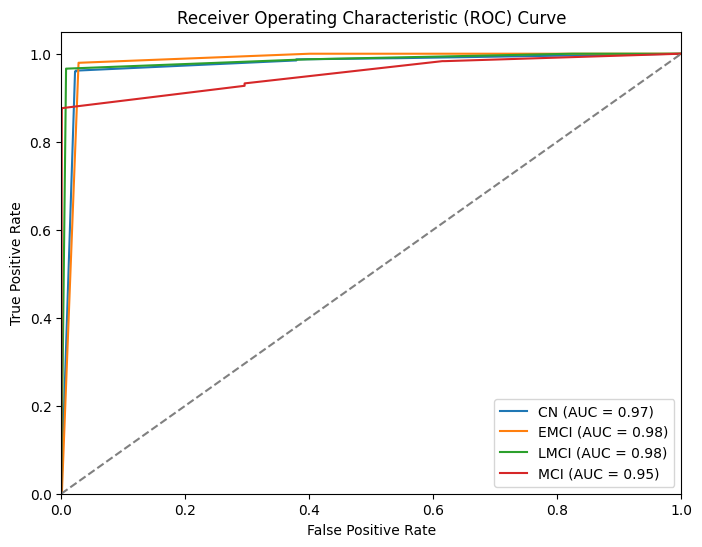

In [7]:
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, roc_auc_score, roc_curve
from tensorflow.keras.models import load_model
import numpy as np

# Load the saved model
model = load_model("/content/drive/MyDrive/Capstone/Models/CNN_Feature_Final.h5")

# Assuming you have X_test and y_test
# Generate predictions
y_pred = model.predict(X_test)

# Check the shape and content of y_test
print("Shape of y_test:", y_test.shape)
print("Unique values in y_test:", np.unique(y_test))

# If y_test is one-hot encoded, convert it to class labels
if len(y_test.shape) > 1 and y_test.shape[1] > 1:
    y_test_labels = np.argmax(y_test, axis=1)
else:
    y_test_labels = y_test

# Define category labels
category_labels = ['CN', 'EMCI', 'LMCI', 'MCI']

# Generate classification report
print("Classification Report:")
print(classification_report(y_test_labels, np.argmax(y_pred, axis=1), target_names=category_labels))

# Calculate ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
num_classes = len(category_labels)
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve((y_test_labels == i).astype(int), y_pred[:, i])
    roc_auc[i] = roc_auc_score((y_test_labels == i).astype(int), y_pred[:, i])

# Plot ROC curves
plt.figure(figsize=(8, 6))
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], label=f'{category_labels[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

## Random forest model

In [8]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestClassifier()

rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# AUC calculation for Random Forest
auc = roc_auc_score(y_test, rf_model.predict_proba(X_test), multi_class='ovr')
print("\nAUC:", auc)

Accuracy: 0.9580318379160637

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95       390
           1       0.92      0.98      0.95       341
           2       0.98      0.97      0.98       473
           3       0.99      0.88      0.93       178

    accuracy                           0.96      1382
   macro avg       0.96      0.95      0.95      1382
weighted avg       0.96      0.96      0.96      1382


AUC: 0.974338447924928


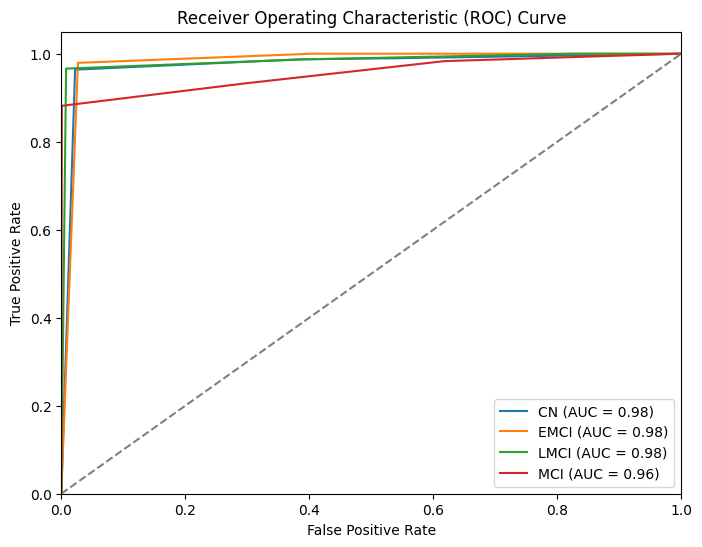

In [9]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

# Calculate ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
num_classes = len(label_encoder.classes_)
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve((y_test == i).astype(int), rf_model.predict_proba(X_test)[:, i])
    roc_auc[i] = roc_auc_score((y_test == i).astype(int), rf_model.predict_proba(X_test)[:, i])

# Define category labels
category_labels = ['CN', 'EMCI', 'LMCI', 'MCI']

# Plot ROC curves
plt.figure(figsize=(8, 6))
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], label=f'{category_labels[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [ ]:
model_save_path = "/content/drive/MyDrive/Capstone/Models/ML_Feature_Final.h5"

model.save(model_save_path)

print("Model saved successfully at:", model_save_path)


Model saved successfully at: /content/drive/MyDrive/Capstone/Models/ML_Feature_Final.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# Final Prediction

1/1 [==============================] - 1s 601ms/step


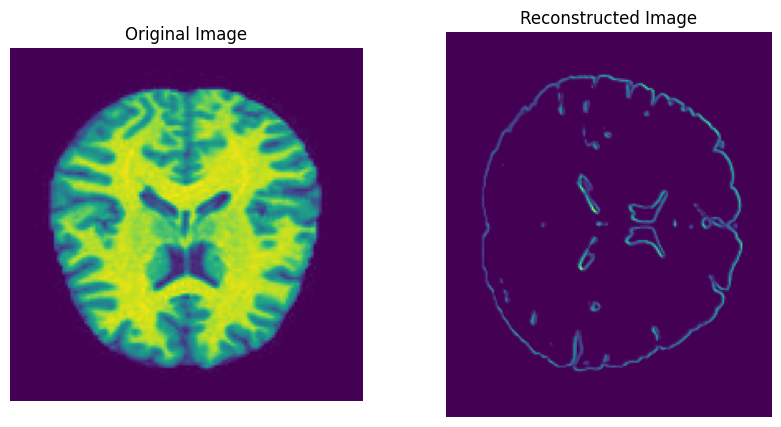

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from PIL import Image
import numpy as np

model_path = "/content/drive/MyDrive/Capstone/Models/Auto_Encoder_Model.h5"
autoencoder = load_model(model_path)

image_path = "/content/drive/MyDrive/Capstone/MRI/CN/CN10.jpg"
image = Image.open(image_path)

input_shape = autoencoder.input_shape[1:3]
resized_image = image.resize(input_shape, Image.LANCZOS)

image_array = np.array(resized_image) / 255.0

if len(image_array.shape) == 2:
    image_array = np.stack((image_array,) * 3, axis=-1)

image_array = np.transpose(image_array, (1, 0, 2))
image_array = np.expand_dims(image_array, axis=0)

reconstructed_image = autoencoder.predict(image_array)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image)
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Reconstructed Image")
plt.imshow(reconstructed_image[0])
plt.axis("off")

plt.show()

reconstructed_image_variable = reconstructed_image[0]

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model
from PIL import Image
import numpy as np

# Load the model
model_path = "/content/drive/MyDrive/Capstone/Models/cnn_seg_aug_model.h5"
model = load_model(model_path)

input_shape = model.input_shape[1:3]
resized_image = tf.image.resize(reconstructed_image_variable, input_shape)

resized_image = tf.image.grayscale_to_rgb(resized_image)

resized_image = tf.expand_dims(resized_image, axis=0)

features = model.predict(resized_image)

features_array = np.concatenate(features, axis=0)

1/1 [==============================] - 0s 138ms/step


In [ ]:
import numpy as np
from tensorflow.keras.models import load_model

model_path = "/content/drive/MyDrive/Capstone/Models/CNN_Feature_Final.h5"
model = load_model(model_path)

if len(features_array.shape) == 1:
    features_array = np.expand_dims(features_array, axis=0)

predictions = model.predict(features_array)

categories = ['CN', 'MCI', 'LMCI', 'EMCI']
predicted_categories = [categories[idx] for idx in np.argmax(predictions, axis=-1)]
predicted_probabilities = np.max(predictions, axis=-1)

print("Predicted categories:", predicted_categories)
print("Predicted probabilities:", predicted_probabilities)

1/1 [==============================] - 0s 103ms/step
Predicted categories: ['EMCI']
Predicted probabilities: [0.98589027]


In [ ]:
import tensorflow as tf

model_path = "/content/drive/MyDrive/Capstone/Models/ML_Feature_Final.h5"
model = tf.keras.models.load_model(model_path)

predictions = model.predict(features_array)

predicted_categories = [categories[idx] for idx in np.argmax(predictions, axis=-1)]
predicted_probabilities = np.max(predictions, axis=-1)

print("Predicted categories:", predicted_categories)
print("Predicted probabilities:", predicted_probabilities)

1/1 [==============================] - 0s 86ms/step
Predicted categories: ['EMCI']
Predicted probabilities: [0.98589027]


In [ ]:
!pip install neuralplot

In [ ]:
# Importing Libraries
from neuralplot import ModelPlot
import tensorflow as tf
import numpy as np

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from keras.utils.vis_utils import plot_model

def build_model():
    model = Sequential()

    model.add(Conv2D(filters=16, kernel_size=(3, 3), strides=(1, 1), activation="relu", kernel_initializer='he_normal',
                     input_shape=(128, 128, 3)))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(filters=32, kernel_size=(3, 3), strides=(1, 1), activation="relu", kernel_initializer='he_normal'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation="relu", kernel_initializer='he_normal'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Flatten())
    model.add(Dense(128, activation="relu", kernel_initializer='he_normal'))
    model.add(Dense(64, activation="relu"))
    model.add(Dense(4, activation="softmax"))

    model.compile(optimizer='adam', loss="sparse_categorical_crossentropy", metrics=['accuracy'])

    model.summary()

    return model

model = build_model()

# Plot the model architecture
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)

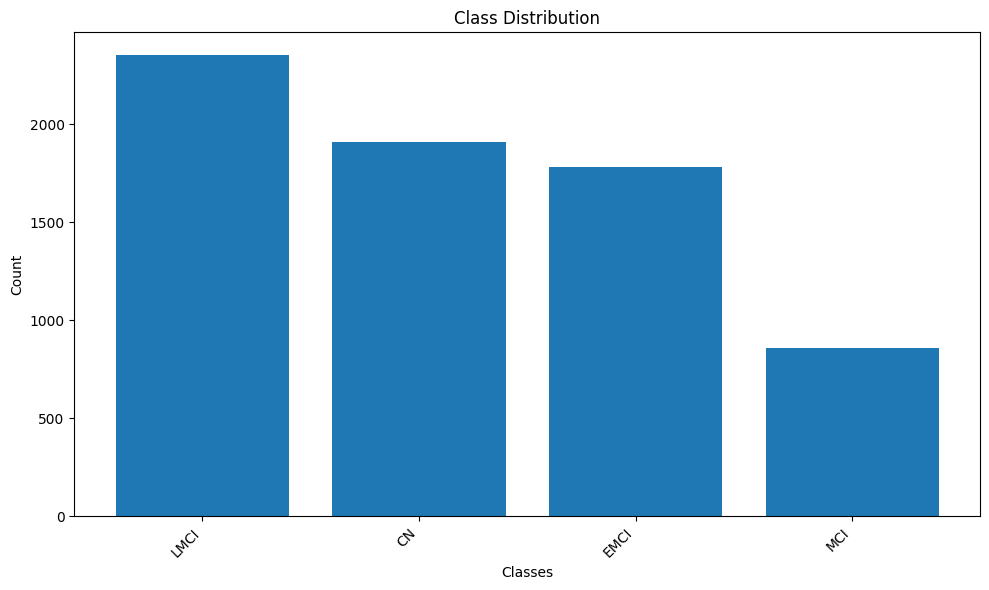

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("/content/drive/MyDrive/Capstone/Models/cnn-seg-aug.csv")

value_counts = df.iloc[:, -1].value_counts()

plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.bar(value_counts.index, value_counts.values)
plt.xlabel("Classes")
plt.ylabel("Count")
plt.title("Class Distribution")
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for readability
plt.tight_layout()  # Improve layout
plt.show()